# LA-Fusion
- A python-custom code for image fusion between LA-ICP-MS and microscopy images to improve a spatial resolution of a LA-ICP-MS image.

In [1]:
import sys
sys.path.append("../") # go to parent dir

from Reg_Code import *

# LA-ICP-MS data processing¶
The data is uploaded in .xlsx format and stored in the inputs/LA_ICP_Images folder. Specific parameters and options, such as hotspot removal, are described below.
Prepare and Upload LA-ICP-MS Data

1.Process LA-ICP-MS data using the LA-RegSegImage software.
Save the processed data as an .xlsx file.
Place the .xlsx file in the folder: inputs/LA_ICP_Images.

2.Hotspot Removal

Hotspot removal is used to correct qualitative image quality by removing a small number of extreme data points that may distort the image.
Quantile: Specify the percentile cutoff for the upper bound of the data.

Example: 
- Set Quantile = 1 to disable hotspot removal (no cutoff).
- Use a value 0.99 to remove extreme outliers.

3.Background Image for LA-ICP-MS Data
The background image file for LA-ICP-MS data should be specified in the script.
Parameter: BM_LA_path
File Location: The background image file must be in the folder: inputs/LA_ICP_Images.
Example: If the background file is named background_image.xlsx, set BM_LA_path = "background_image.xlsx".

4.Specify the Number of LA-ICP-MS Images
Parameter: image_columns_LA
This refers to the total number of LA-ICP-MS images stored in the inputs/LA_ICP_Images folder.
Example: If there are 3 images in the folder, set image_columns_LA = 3.


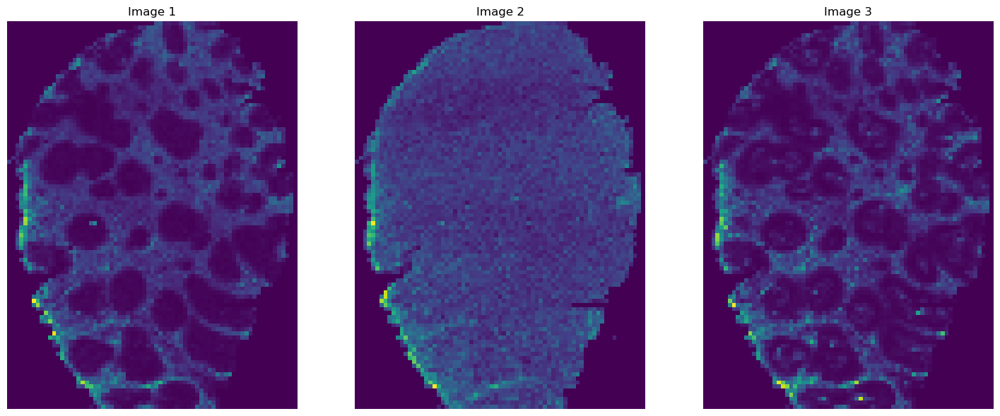

In [2]:
foldername_LA = '../example/inputs/LA_ICP_Images/'
extension = '*.xl'
quantile = 1
BM_LA_path = 'inputs/LA_ICP_Images/background_mask.csv'
image_columns_LA = 3

# Read LA-ICP images
images_LA = LA_process(foldername_LA, extension)

# Process LA-ICP images by hotspot removal
images_processed_LA, BM_LA = hotspot_removal(images_LA, quantile, BM_LA_path)


images_plot(images_processed_LA, image_columns_LA)

# Selecting the LA-ICP-MS Image Channel for Background Removal

When working with low-resolution LA-ICP-MS images, it is important to select a specific image channel to be used for background removal. The channel corresponds to the metal or element of interest, based on the order of images processed in the previous step.

1.Select the Background Image Channel

Use the index number of the image corresponding to the metal or element for background removal.
The index numbers follow the order in which the images were displayed or processed in the previous session.
Example: In this case we used Zn image as a background index, so Zn is the metal number two in the list. Set nmetals = 2.

2.Adjust the Color Bar Limits

min_value: The minimum value of the color bar displayed in the plot.
max_value: The maximum value of the color bar displayed in the plot.
Adjust these values as needed to optimize the visualization of the image.
Example: 
min_value = 0
max_value = 2000

3.Select the Color Scheme for the Image
Parameter: plt_color
Specify the color scheme to display the image (e.g., 'viridis', 'plasma', 'hot', etc.).

# Background removal for low resolution image

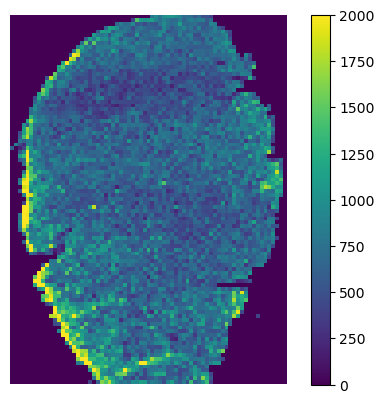

LA image size: (95, 71)


In [3]:
#Selecting one metal from the lists to be used as a background index
nmetals = 2
min_value = 0
max_value = 2000
plt_color = 'viridis'
LA_image = select_LA_channel(images_processed_LA, nmetals,min_value,max_value,plt_color)

In [4]:
final_matrices = LA_image 
line = 2
std_threshold = 1.6
background_mask = remove_background(final_matrices,line,std_threshold)

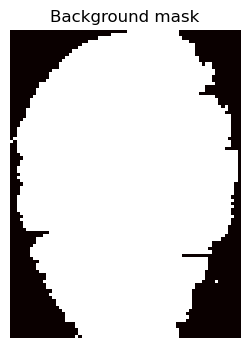

In [5]:
generate_background_plot(background_mask)

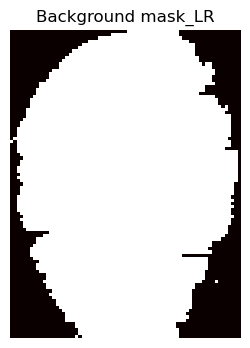

In [6]:
background_mask_LR = background_mask
plt.figure(figsize=[5,4]) 
plt.imshow(background_mask_LR, interpolation='None', cmap=plt.cm.hot)
plt.title('Background mask_LR')
plt.axis('off')
plt.show()

# Uploading a Microscopy Image

1.Locate the Microscopy Image
Ensure the microscopy image of the tissue is saved in the inputs folder.
Verify that the image file is correctly formatted (e.g., .png, .jpg, or .tif) and free of errors.

2.Rename and Specify the File Path
Update the file_path parameter to match the name of the microscopy image you want to upload.

Example:
If the image file is named microscopy_image.tif, set:
file_path = "inputs/microscopy_image.tif"

3.Upload the Image into LA-Fusion

With the file_path parameter set correctly, the microscopy image will be loaded into the LA-Fusion software for further processing.


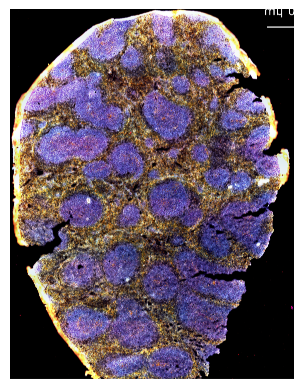

In [7]:
file_path = 'inputs/microscopy.tif'
image = Image.open(file_path)
plt.imshow(image)
plt.axis('off')  # Hide the axes
plt.show()

Microscopy images are typically acquired at a spatial resolution of 1 µm. This step adjusts the resolution to achieve the desired final resolution.

For example, if new_resolution = 5, the final image resolution will be 5 µm.

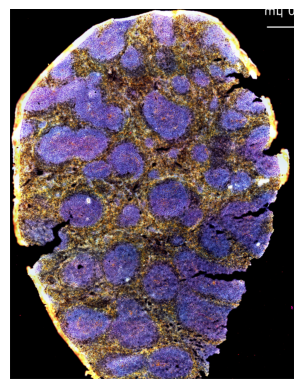

In [8]:
new_resolution = 5
original_size = image.size
new_size = (original_size[0] // new_resolution, original_size[1] // new_resolution)
resized_image = image.resize(new_size, Image.Resampling.LANCZOS)
image = resized_image
plt.imshow(image)
plt.axis('off')  # Hide the axes
plt.show()

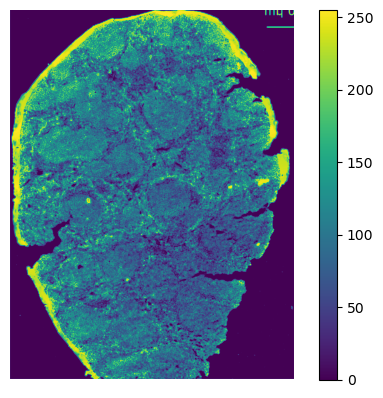

AF image size: (1880, 1444)


In [9]:
gray_image = convert_to_greyscale(image)

# Down-sampling the Microscopy Image Before Image Registration
This step reduces the dimensions of the microscopy image to match the dimensions of the LA-ICP-MS data. Matching dimensions ensures successful alignment during image registration.

Identify the Target Dimensions. The dimensions of the LA-ICP-MS data can be found in the background removal step.
Example:

If the LA-ICP-MS data has dimensions of (71 x 95), the microscopy image must also be resized to (71 x 95).

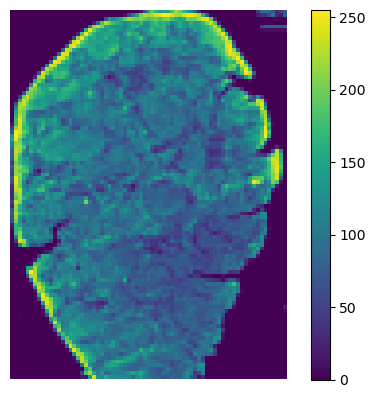

AF image size: (95, 71)


In [10]:
x = 71
y = 95
AF_image = rezise_AF_image(x, y, gray_image)
dimension = AF_image.shape
print("AF image size:", dimension)

# Selecting the LA-ICP-MS Image Channel for Registration and Fusion
To perform image registration and fusion, you need to select a specific LA-ICP-MS image channel corresponding to the metal of interest. The channel selection is based on the order of images displayed during the LA-ICP-MS data processing session.

1.Choose the LA-ICP-MS Image Channel

Identify the index number of the image channel corresponding to the metal you want to use for image fusion.
The index numbers follow the sequence of images processed earlier.
Example: In this case we want to fuse Fe image, so image number 3 corresponds to Fe, set the nmetals = 3.

2.Set the Color Bar Limits
min_value: The minimum value of the color bar to display in the plot.
max_value: The maximum value of the color bar to display in the plot.
Adjust these values to optimize visualization of the LA-ICP-MS image.

3.Select the Color Scheme
plt_color: Specify the color scheme for displaying the image (e.g., 'viridis', 'plasma', 'hot', etc.).

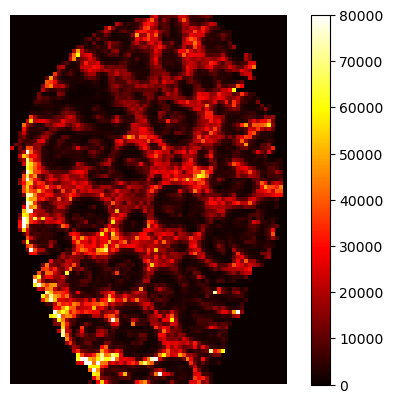

LA image size: (95, 71)


In [11]:
nmetals = 3
min_value = 0
max_value = 80000
plt_color= 'hot'
LA_image = select_LA_channel(images_processed_LA, nmetals,min_value,max_value,plt_color)

# Image Registration Between LA-ICP-MS and Microscopy Images
1.Set the Fixed Image
The microscopy image is used as the fixed image because it has a higher spatial resolution and serves as the reference for alignment.
Set: fixed_image = AF_image

2.Set the Moving Image
The LA-ICP-MS image is used as the moving image, which will be transformed to align with the fixed microscopy image.
Set: moving_image = LA_image

3.Use an Affine Parameter Map
An affine parameter map is applied for registration.
Set: parameter_map = 'affine'

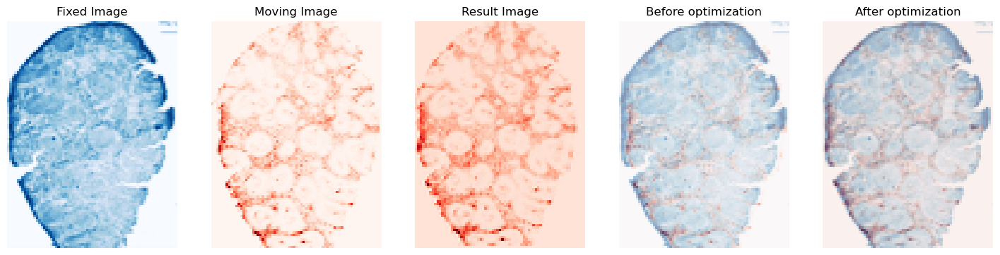

In [12]:
fixed_image = AF_image
moving_image = LA_image
parameter_map = 'affine'
ResultArray, FixedArray, MovingArray, TransParameterMap = registration(fixed_image, moving_image, parameter_map)

registration_plot(ResultArray, FixedArray, MovingArray)


# Registration evaluation

# DSC calculation
The Dice Similarity Coefficient (DSC) is used to evaluate the overlap between binary masks before and after image registration. This helps assess the quality of the registration process.
1. To facilitate binary mask creation in ImageJ, the fixed image array, moving image array, and resulting image array are exported as .txt files. These text files can then be imported into ImageJ for further processing.

In [13]:
array = FixedArray
folder = 'outputs'
filename = 'FixedArray.csv'
file_path = os.path.join(folder, filename)
np.savetxt(file_path, array, fmt='%d', delimiter=',')

array = MovingArray
folder = 'outputs'
filename = 'MovingArray.csv'
file_path = os.path.join(folder, filename)
np.savetxt(file_path, array, fmt='%d', delimiter=',')

array = ResultArray
folder = 'outputs'
filename = 'ResultArray.csv'
file_path = os.path.join(folder, filename)
np.savetxt(file_path, array, fmt='%d', delimiter=',')

2.Upload the Binary Masks.
Load the binary masks for the three images:
- AF_mask: Binary mask of the fixed image (microscopy).
- LA_mask: Binary mask of the moving image (LA-ICP-MS image before registration).
- Transformed_mask: Binary mask of the resulting image (LA-ICP-MS image after registration).

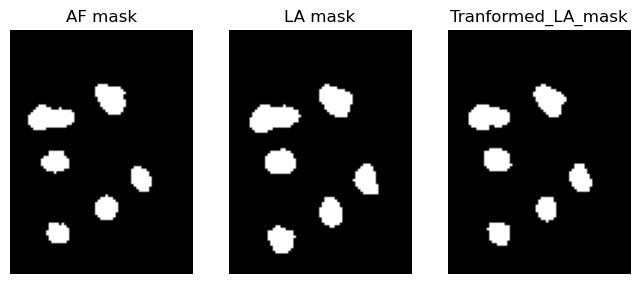

In [14]:
AF_mask = np.loadtxt('inputs/fixed-mask.txt', delimiter='\t')
AF_mask[AF_mask == 255] = 1
LA_mask = np.loadtxt('inputs/moving-mask.txt', delimiter='\t')
LA_mask[LA_mask == 255] = 1
Tranformed_LA_mask = np.loadtxt('inputs/resulting-mask.txt', delimiter='\t')
Tranformed_LA_mask[Tranformed_LA_mask == 255] = 1

plt.figure(figsize=(8, 7))
ax=plt.subplot(1,3,1)
plt.imshow(AF_mask, cmap='gray', alpha=1)
plt.axis('off')
plt.title('AF mask')
ax=plt.subplot(1,3,2)
plt.imshow(LA_mask, cmap='gray', alpha=1)
plt.axis('off')
plt.title('LA mask')
ax=plt.subplot(1,3,3)
plt.imshow(Tranformed_LA_mask, cmap='gray', alpha=1)
plt.axis('off')
plt.title('Tranformed_LA_mask')
plt.show()


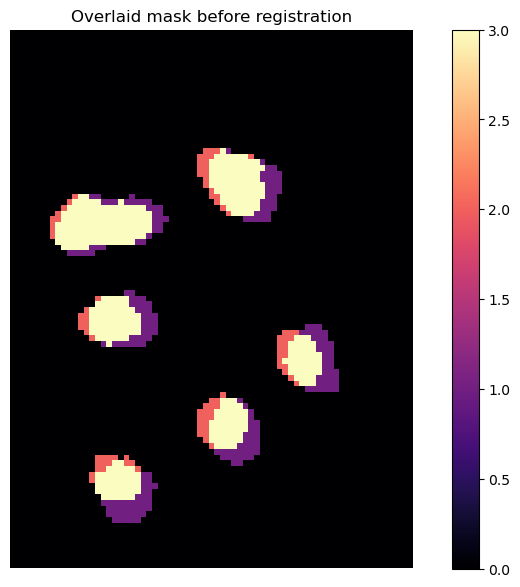

In [15]:
AF_mask[AF_mask==1] =2

Combined_masks_1 = AF_mask + LA_mask

plt.figure(figsize=(10,7))
plt.imshow(Combined_masks_1, cmap='magma')
plt.title('Overlaid mask before registration')
plt.colorbar()
plt.axis('off')
plt.show()

In [16]:
Pixel_1 = Combined_masks_1[Combined_masks_1 == 1]
Pixel_2 = Combined_masks_1[Combined_masks_1 == 2]
Pixel_3 = Combined_masks_1[Combined_masks_1 == 3]

DSC = (2*len(Pixel_3))/((2*len(Pixel_3))+len(Pixel_2)+len(Pixel_1))
print('DSC value before registratiom', DSC)

DSC value before registratiom 0.7259911894273128


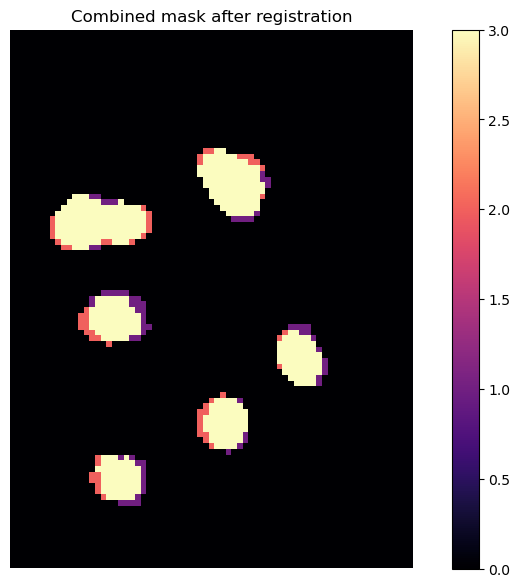

In [17]:
AF_mask[AF_mask==1] =2

Combined_masks_2 = AF_mask + Tranformed_LA_mask

plt.figure(figsize=(10,7))
plt.imshow(Combined_masks_2, cmap='magma')
plt.title('Combined mask after registration')
plt.colorbar()
plt.axis('off')
plt.show()

In [18]:
Pixel_1 = Combined_masks_2[Combined_masks_2 == 1]
Pixel_2 = Combined_masks_2[Combined_masks_2 == 2]
Pixel_3 = Combined_masks_2[Combined_masks_2 == 3]

DSC = (2*len(Pixel_3))/((2*len(Pixel_3))+len(Pixel_2)+len(Pixel_1))
print('DSC value after registration', DSC)

DSC value after registration 0.8700787401574803


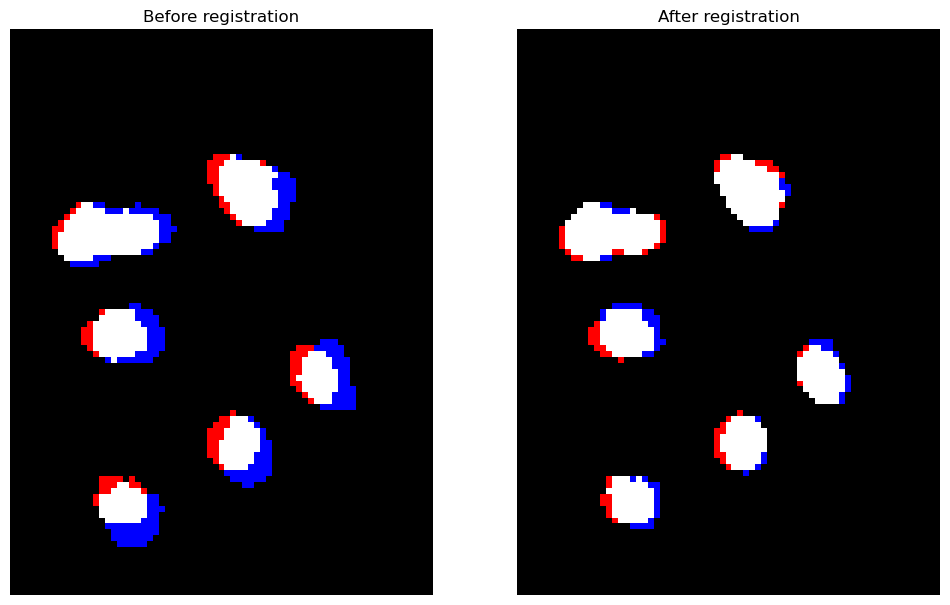

In [19]:
colors = ['black', 'blue', 'red', 'white']
cmap = ListedColormap(colors)

bounds = [0, 1, 2, 3, 4]
norm = plt.Normalize(vmin=0, vmax=3)


AF_mask[AF_mask == 1] = 2
Combined_masks_1 = AF_mask + LA_mask


plt.figure(figsize=(12, 9))
ax=plt.subplot(1,2,1)
plt.imshow(Combined_masks_1, cmap=cmap, norm=norm, alpha=1)
plt.axis('off')
plt.title('Before registration')
ax=plt.subplot(1,2,2)
plt.imshow(Combined_masks_2, cmap=cmap, norm=norm, alpha=1)
plt.axis('off')
plt.title('After registration')
plt.show()


# Transforming Microscopy Image Variables
Microscopy images are typically stored in the RGB color space. This step converts the RGB image into other color spaces, such as HSV, Lab, and YCrCb, to enable advanced analysis and feature extraction.

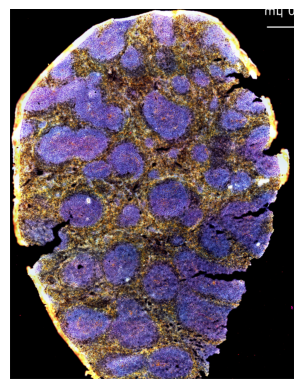

In [20]:
#Replot microscopy image
plt.imshow(image)
plt.axis('off')  # Hide the axes
plt.show()

In [21]:
image = image.convert('RGB')
image = np.asarray(image)

hsv_image = cv2.cvtColor(image, cv2.COLOR_BGR2HSV)
lab_image = cv2.cvtColor(image, cv2.COLOR_BGR2LAB)
ycrcb_image = cv2.cvtColor(image, cv2.COLOR_BGR2YCrCb)

r, g, b = cv2.split(image)
h, s, v = cv2.split(hsv_image) 
l, a, b_lab = cv2.split(lab_image)
y, cr, cb = cv2.split(ycrcb_image)

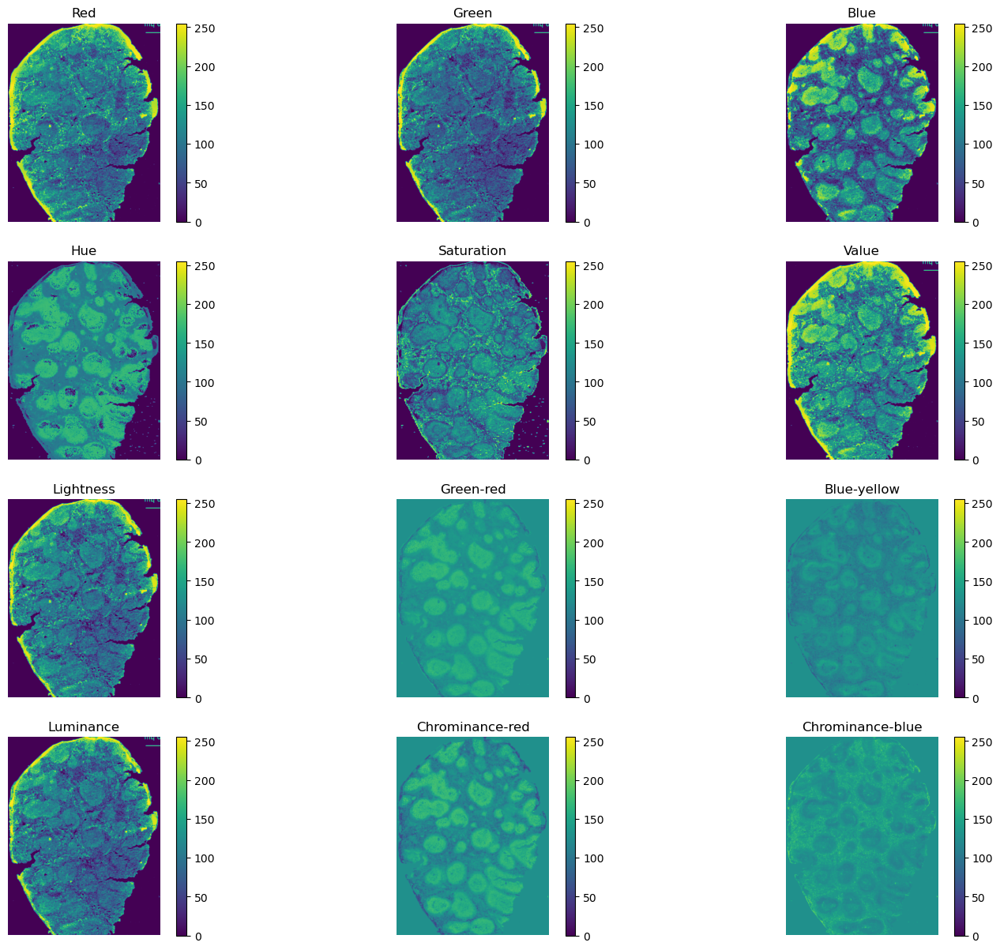

In [22]:
plt.figure(figsize=(18, 15))
ax=plt.subplot(4,3,1)
plt.imshow(r, vmin=0,vmax=255, cmap=plt.cm.viridis)
plt.title('Red')
plt.colorbar()
plt.axis('off')


ax=plt.subplot(4,3,2)
plt.imshow(g, vmin=0,vmax=255, cmap=plt.cm.viridis)
plt.title('Green')
plt.colorbar()
plt.axis('off')


ax=plt.subplot(4,3,3)
plt.imshow(b, vmin=0,vmax=255, cmap=plt.cm.viridis)
plt.title('Blue')
plt.colorbar()
plt.axis('off')


ax=plt.subplot(4,3,4)
plt.imshow(h, vmin=0,vmax=255, cmap=plt.cm.viridis)
plt.title('Hue')
plt.colorbar()
plt.axis('off')


ax=plt.subplot(4,3,5)
plt.imshow(s, vmin=0,vmax=255, cmap=plt.cm.viridis)
plt.title('Saturation')
plt.colorbar()
plt.axis('off')


ax=plt.subplot(4,3,6)
plt.imshow(v, vmin=0,vmax=255, cmap=plt.cm.viridis)
plt.title('Value')
plt.colorbar()
plt.axis('off')


ax=plt.subplot(4,3,7)
plt.imshow(l, vmin=0,vmax=255, cmap=plt.cm.viridis)
plt.title('Lightness')
plt.colorbar()
plt.axis('off')


ax=plt.subplot(4,3,8)
plt.imshow(a, vmin=0,vmax=255, cmap=plt.cm.viridis)
plt.title('Green-red')
plt.colorbar()
plt.axis('off')


ax=plt.subplot(4,3,9)
plt.imshow(b_lab, vmin=0,vmax=255, cmap=plt.cm.viridis)
plt.title('Blue-yellow')
plt.colorbar()
plt.axis('off')


ax=plt.subplot(4,3,10)
plt.imshow(y, vmin=0,vmax=255, cmap=plt.cm.viridis)
plt.title('Luminance')
plt.colorbar()
plt.axis('off')


ax=plt.subplot(4,3,11)
plt.imshow(cr, vmin=0,vmax=255, cmap=plt.cm.viridis)
plt.title('Chrominance-red')
plt.colorbar()
plt.axis('off')


ax=plt.subplot(4,3,12)
plt.imshow(cb, vmin=0,vmax=255, cmap=plt.cm.viridis)
plt.title('Chrominance-blue')
plt.colorbar()
plt.axis('off')

plt.show()

# Applying Non-linear Power Law to Available Microscopy Variables
- Certain microscopy variables, such as blue, saturation, and hue, may benefit from gamma correction. This transformation can help enhance linear correlations in multivariate regression models by adjusting the intensity distribution of these variables.

1.Select the Microscopy Variable
The chosen variable is indicated by the variable_index.

For example, if red is selected, the index would be r.

Set: variable_index = r

The index corresponds to the transformed variable from the previous step (e.g., HSV, Lab, or YCrCb color spaces).

2.Set the Gamma Values
Gamma correction is applied to the selected variable using specific gamma values to adjust the intensity and improve the linearity of correlations.
Define the gamma values using gamma_values, depending on the desired level of enhancement.

# e.g., red variable

<Figure size 1800x1500 with 0 Axes>

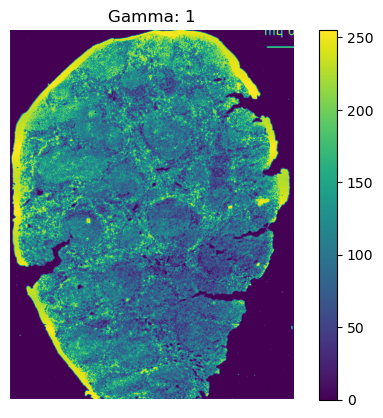

<Figure size 1800x1500 with 0 Axes>

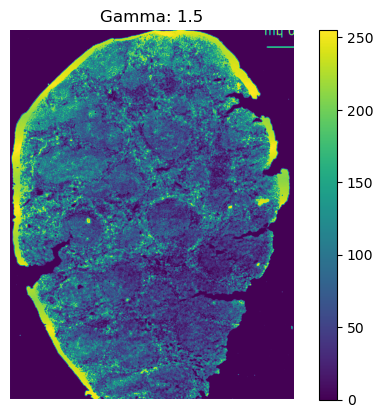

<Figure size 1800x1500 with 0 Axes>

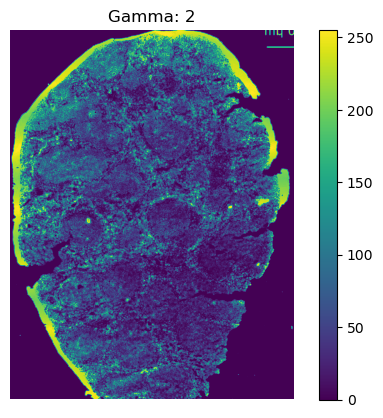

<Figure size 1800x1500 with 0 Axes>

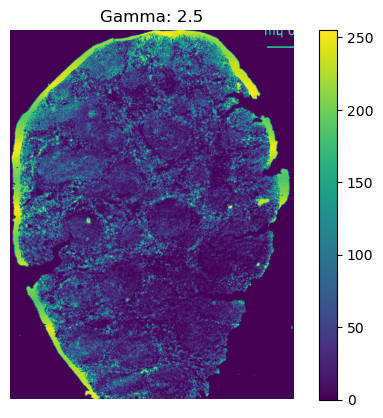

<Figure size 1800x1500 with 0 Axes>

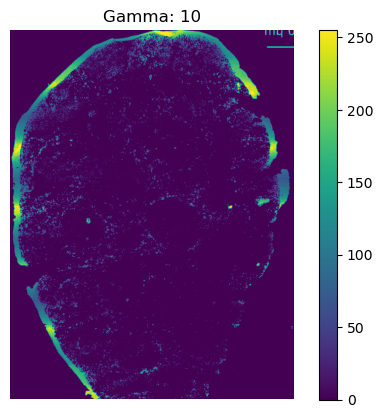

In [23]:
variable_index = r
gamma_values = [1, 1.5, 2, 2.5, 10]

gamma_images = {}

for gamma in gamma_values:
    # Apply gamma correction and store in the dictionary
    gamma_images[gamma] = np.array(255 * (variable_index / 255) ** gamma, dtype='uint8')
    
    plt.figure(figsize=(18, 15))
    plt.figure()
    plt.imshow(gamma_images[gamma])
    plt.title('Gamma: ' + str(gamma))
    plt.colorbar()
    plt.axis('off')


plt.show()

- Then identify the selected gamma value in 'gamma', for example, gamma = 10.

(-0.5, 1443.5, 1879.5, -0.5)

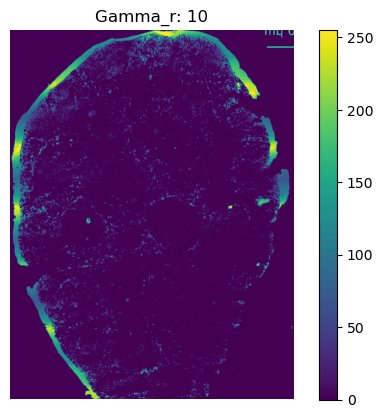

In [24]:
gamma = 10
gamma_r = gamma_images[gamma]
plt.figure()
plt.imshow(gamma_r)
plt.title('Gamma_r: ' + str(gamma))
plt.colorbar()
plt.axis('off')

# e.g., saturation channel

<Figure size 1800x1500 with 0 Axes>

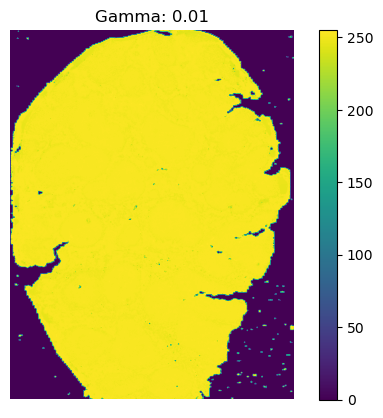

<Figure size 1800x1500 with 0 Axes>

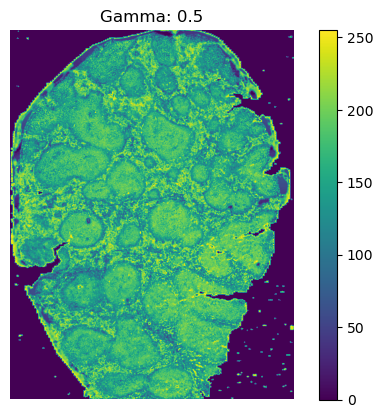

<Figure size 1800x1500 with 0 Axes>

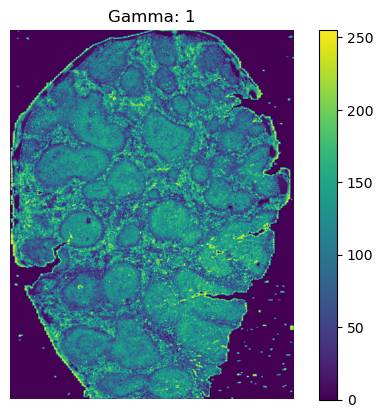

<Figure size 1800x1500 with 0 Axes>

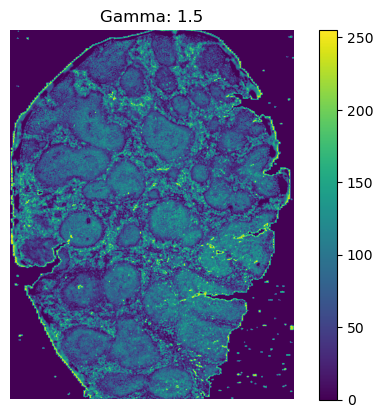

In [25]:
gamma_values = [0.01, 0.5, 1, 1.5]

gamma_images = {}  # Dictionary to store gamma-corrected images

variable_index = s
for gamma in gamma_values:
    # Apply gamma correction and store in the dictionary
    gamma_images[gamma] = np.array(255 * (variable_index / 255) ** gamma, dtype='uint8')
    
    plt.figure(figsize=(18, 15))
    plt.figure()
    plt.imshow(gamma_images[gamma])
    plt.title('Gamma: ' + str(gamma))
    plt.colorbar()
    plt.axis('off')


plt.show()

(-0.5, 1443.5, 1879.5, -0.5)

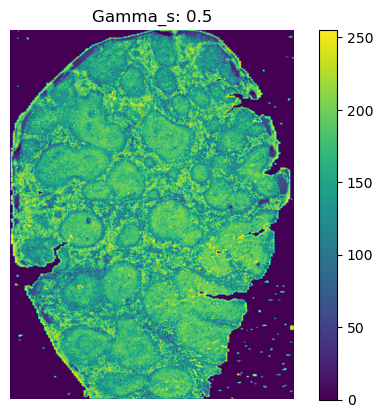

In [26]:
gamma = 0.5
gamma_s = gamma_images[gamma]
plt.figure()
plt.imshow(gamma_s)
plt.title('Gamma_s: ' + str(gamma))
plt.colorbar()
plt.axis('off')

# e.g., hue variable

<Figure size 1800x1500 with 0 Axes>

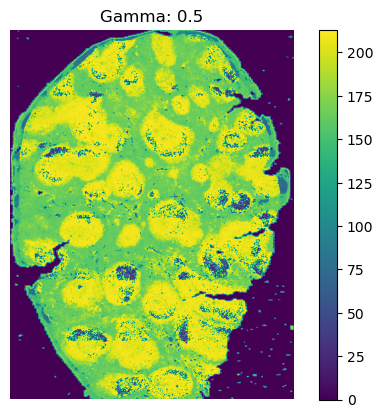

<Figure size 1800x1500 with 0 Axes>

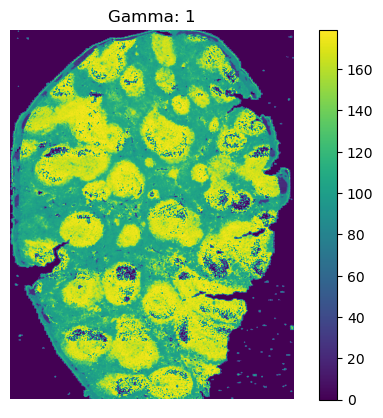

<Figure size 1800x1500 with 0 Axes>

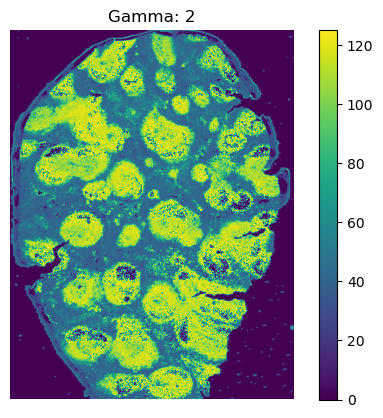

<Figure size 1800x1500 with 0 Axes>

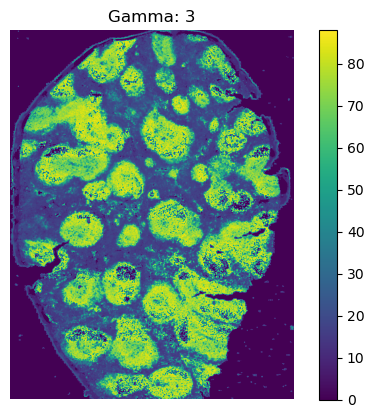

In [27]:
gamma_values = [0.5, 1, 2, 3]

gamma_images = {}  # Dictionary to store gamma-corrected images

variable_index = h
for gamma in gamma_values:
    # Apply gamma correction and store in the dictionary
    gamma_images[gamma] = np.array(255 * (variable_index / 255) ** gamma, dtype='uint8')
    
    plt.figure(figsize=(18, 15))
    plt.figure()
    plt.imshow(gamma_images[gamma])
    plt.title('Gamma: ' + str(gamma))
    plt.colorbar()
    plt.axis('off')


plt.show()

(-0.5, 1443.5, 1879.5, -0.5)

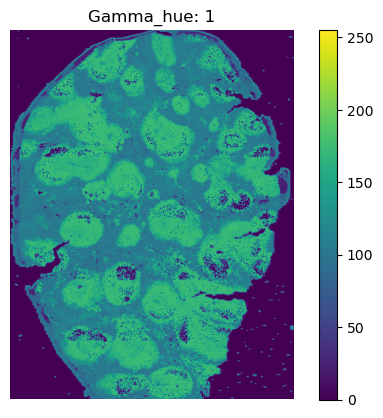

In [28]:
gamma = 1
gamma_h = gamma_images[gamma]
plt.figure()
plt.imshow(gamma_h, vmin=0,vmax=255, cmap=plt.cm.viridis)
plt.title('Gamma_hue: ' + str(gamma))
plt.colorbar()
plt.axis('off')

# Background Removal for High Resolution Image
The goal of this step is to create a background for a high-resolution image, which helps in normalizing the image and removing noise or unwanted background signals. The background removal process involves selecting a specific microscopy variable and calculating the background intensity based on specific parameters.

1.Specify the Microscopy Variable

The microscopy variable used to create the background is indicated in final_matrices.

For example, final_matrices = r, indicating that the saturation variable will be used to calculate the background.

2.Specify the Line for Background Calculation

line = 600: This indicates the specific line in the image (line 100 in this case) where the background intensity will be calculated.

3.Set the Standard Deviation Threshold

std_threshold = 0.01: This threshold represents the acceptable range of variability (standard deviation) for the background intensity. Values within this threshold are considered part of the background

In [39]:
final_matrices = r
line = 600
std_threshold = 0.01
background_mask = remove_background(final_matrices,line,std_threshold)

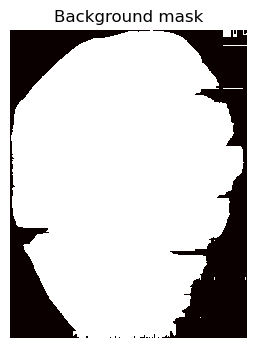

In [40]:
generate_background_plot(background_mask)
background_mask_HR = background_mask

# Background Removal for Transformed Microscopy Variables
- Background of each high-resolution microscopy variables is removed in this step.

In [41]:
r = r*background_mask_HR
g = g*background_mask_HR
b = b*background_mask_HR
h = h*background_mask_HR
s = s*background_mask_HR
v = v*background_mask_HR
l = l*background_mask_HR
a = a*background_mask_HR
b_lab = b_lab*background_mask_HR
y = y*background_mask_HR
cr = cr*background_mask_HR
cb = cb*background_mask_HR
gamma_r = gamma_r*background_mask_HR
gamma_s = gamma_s*background_mask_HR
gamma_h = gamma_h*background_mask_HR

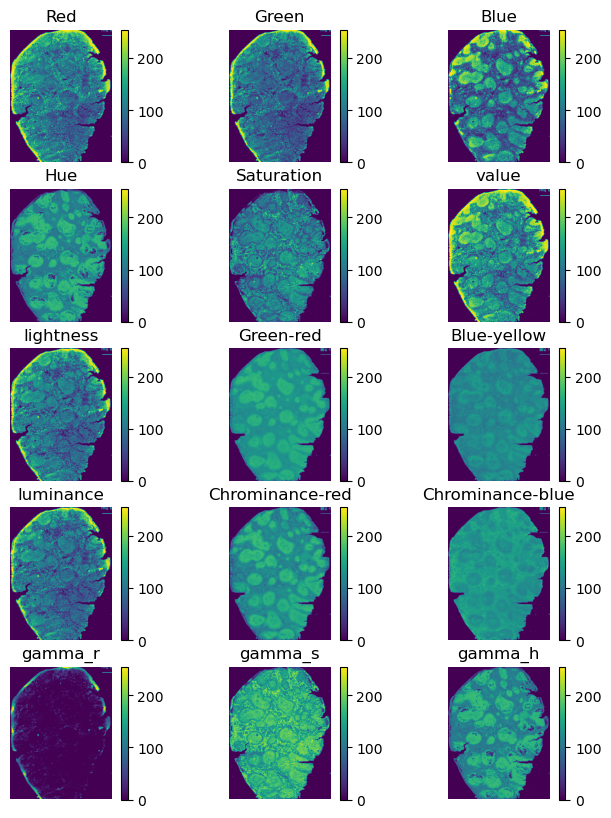

In [42]:
plt.figure(figsize=(8, 10))
ax=plt.subplot(5,3,1)
plt.imshow(r, vmin=0,vmax=255, cmap=plt.cm.viridis)
plt.title('Red')
plt.colorbar()
plt.axis('off')


ax=plt.subplot(5,3,2)
plt.imshow(g, vmin=0,vmax=255, cmap=plt.cm.viridis)
plt.title('Green')
plt.colorbar()
plt.axis('off')


ax=plt.subplot(5,3,3)
plt.imshow(b, vmin=0,vmax=255, cmap=plt.cm.viridis)
plt.title('Blue')
plt.colorbar()
plt.axis('off')


ax=plt.subplot(5,3,4)
plt.imshow(h, vmin=0,vmax=255, cmap=plt.cm.viridis)
plt.title('Hue')
plt.colorbar()
plt.axis('off')


ax=plt.subplot(5,3,5)
plt.imshow(s, vmin=0,vmax=255, cmap=plt.cm.viridis)
plt.title('Saturation')
plt.colorbar()
plt.axis('off')


ax=plt.subplot(5,3,6)
plt.imshow(v, vmin=0,vmax=255, cmap=plt.cm.viridis)
plt.title('value')
plt.colorbar()
plt.axis('off')


ax=plt.subplot(5,3,7)
plt.imshow(l, vmin=0,vmax=255, cmap=plt.cm.viridis)
plt.title('lightness')
plt.colorbar()
plt.axis('off')


ax=plt.subplot(5,3,8)
plt.imshow(a, vmin=0,vmax=255, cmap=plt.cm.viridis)
plt.title('Green-red')
plt.colorbar()
plt.axis('off')


ax=plt.subplot(5,3,9)
plt.imshow(b_lab, vmin=0,vmax=255, cmap=plt.cm.viridis)
plt.title('Blue-yellow')
plt.colorbar()
plt.axis('off')


ax=plt.subplot(5,3,10)
plt.imshow(y, vmin=0,vmax=255, cmap=plt.cm.viridis)
plt.title('luminance')
plt.colorbar()
plt.axis('off')


ax=plt.subplot(5,3,11)
plt.imshow(cr, vmin=0,vmax=255, cmap=plt.cm.viridis)
plt.title('Chrominance-red')
plt.colorbar()
plt.axis('off')


ax=plt.subplot(5,3,12)
plt.imshow(cb, vmin=0,vmax=255, cmap=plt.cm.viridis)
plt.title('Chrominance-blue')
plt.colorbar()
plt.axis('off')

ax=plt.subplot(5,3,13)
plt.imshow(gamma_r, vmin=0,vmax=255, cmap=plt.cm.viridis)
plt.title('gamma_r')
plt.colorbar()
plt.axis('off')


ax=plt.subplot(5,3,14)
plt.imshow(gamma_s, vmin=0,vmax=255, cmap=plt.cm.viridis)
plt.title('gamma_s')
plt.colorbar()
plt.axis('off')


ax=plt.subplot(5,3,15)
plt.imshow(gamma_h, vmin=0,vmax=255, cmap=plt.cm.viridis)
plt.title('gamma_h')
plt.colorbar()
plt.axis('off')
plt.show()

# Processing Microscopy Variables for Image Fusion
In order to perform image fusion, we need to process and organize the high-resolution microscopy variables into compatible formats. This step involvse flattening each 2D array into a 1D array, ensuring that all arrays are of the same size (important for OLS and PLS regression analysis), and organizing the variables for reconstruction.

In [43]:
H_Red_image_flat = r.flatten()
H_Green_image_flat = g.flatten()
H_Blue_image_flat = b.flatten()
H_Hue_image_flat = h.flatten()
H_Saturation_image_flat = s.flatten()
H_Bright_image_flat = v.flatten()
H_Luminance_image_flat = l.flatten()
H_Green_Red_image_flat = a.flatten()
H_Blue_Red_image_flat = b_lab.flatten()
H_Luma_image_flat = y.flatten()
H_Reddif_image_flat = cr.flatten()
H_Bluedif_image_flat = cb.flatten()
H_Gramma_r_flat = gamma_r.flatten()
H_Gramma_s_flat = gamma_s.flatten()
H_Gramma_h_flat = gamma_h.flatten()

In [44]:
size = H_Red_image_flat.size
print("Size of the array:", size)

size = H_Green_image_flat.size
print("Size of the array:", size)

size = H_Blue_image_flat.size
print("Size of the array:", size)

size = H_Hue_image_flat.size
print("Size of the array:", size)

size = H_Saturation_image_flat.size
print("Size of the array:", size)

size = H_Luminance_image_flat.size
print("Size of the array:", size)

size = H_Green_Red_image_flat.size
print("Size of the array:", size)

size = H_Blue_Red_image_flat.size
print("Size of the array:", size)

size = H_Luma_image_flat.size
print("Size of the array:", size)

size = H_Reddif_image_flat.size
print("Size of the array:", size)

size = H_Bluedif_image_flat.size
print("Size of the array:", size)

size = H_Gramma_r_flat.size
print("Size of the array:", size)

size = H_Gramma_s_flat.size
print("Size of the array:", size)

size = H_Gramma_h_flat.size
print("Size of the array:", size)

Size of the array: 2714720
Size of the array: 2714720
Size of the array: 2714720
Size of the array: 2714720
Size of the array: 2714720
Size of the array: 2714720
Size of the array: 2714720
Size of the array: 2714720
Size of the array: 2714720
Size of the array: 2714720
Size of the array: 2714720
Size of the array: 2714720
Size of the array: 2714720
Size of the array: 2714720


In [45]:
data = {}
data['Green'] = H_Green_image_flat
data['Red'] = H_Red_image_flat
data['Blue'] = H_Blue_image_flat
data['Hue'] = H_Saturation_image_flat
data['Saturation'] = H_Saturation_image_flat
data['Bright'] = H_Bright_image_flat
data['Luminance'] = H_Luminance_image_flat
data['Green_Red'] = H_Green_Red_image_flat
data['Blue_Red'] = H_Blue_Red_image_flat
data['Luma'] = H_Luma_image_flat
data['Reddif'] = H_Reddif_image_flat
data['Bluedif'] = H_Bluedif_image_flat
data['Gamma_r'] = H_Gramma_r_flat
data['Gamma_s'] = H_Gramma_s_flat
data['Gamma_h'] = H_Gramma_h_flat
#print(data)

df = pd.DataFrame(data)

#High_res_variables is a set of high resolution microscopy data that will be used in a high-resolution construction of LA-ICP-MS image.
High_res_variables = df[['Red','Green','Blue','Hue','Saturation','Bright','Luminance','Green_Red','Blue_Red','Luma','Reddif','Bluedif']]

In [46]:
image = Image.fromarray(np.uint8(r))
image.save("inputs/r.jpg")

image = Image.fromarray(np.uint8(g))
image.save("inputs/g.jpg")

image = Image.fromarray(np.uint8(b))
image.save("inputs/b.jpg")

image = Image.fromarray(np.uint8(h))
image.save("inputs/h.jpg")

image = Image.fromarray(np.uint8(s))
image.save("inputs/s.jpg")

image = Image.fromarray(np.uint8(v))
image.save("inputs/v.jpg")

image = Image.fromarray(np.uint8(l))
image.save("inputs/l.jpg")

image = Image.fromarray(np.uint8(a))
image.save("inputs/a.jpg")

image = Image.fromarray(np.uint8(b_lab))
image.save("inputs/b_lab.jpg")

image = Image.fromarray(np.uint8(y))
image.save("inputs/luma.jpg")

image = Image.fromarray(np.uint8(cr))
image.save("inputs/rdc.jpg")

image = Image.fromarray(np.uint8(cb))
image.save("inputs/bdc.jpg")

image = Image.fromarray(np.uint8(gamma_r))
image.save("inputs/gamma_r.jpg")

image = Image.fromarray(np.uint8(gamma_s))
image.save("inputs/gamma_s.jpg")

image = Image.fromarray(np.uint8(gamma_h))
image.save("inputs/gamma_h.jpg")

In [47]:
file_path = 'inputs/r.jpg'
r_image = Image.open(file_path)

file_path = 'inputs/g.jpg'
g_image = Image.open(file_path)

file_path = 'inputs/b.jpg'
b_image = Image.open(file_path)

file_path = 'inputs/h.jpg'
h_image = Image.open(file_path)

file_path = 'inputs/s.jpg'
s_image = Image.open(file_path)

file_path = 'inputs/v.jpg'
v_image = Image.open(file_path)

file_path = 'inputs/l.jpg'
l_image = Image.open(file_path)

file_path = 'inputs/a.jpg'
a_image = Image.open(file_path)

file_path = 'inputs/b_lab.jpg'
b_lab_image = Image.open(file_path)

file_path = 'inputs/luma.jpg'
luma_image = Image.open(file_path)

file_path = 'inputs/rdc.jpg'
reddif_image = Image.open(file_path)

file_path = 'inputs/bdc.jpg'
bluedif_image = Image.open(file_path)

file_path = 'inputs/gamma_r.jpg'
gamma_r_image = Image.open(file_path)

file_path = 'inputs/gamma_h.jpg'
gamma_h_image = Image.open(file_path)

file_path = 'inputs/gamma_s.jpg'
gamma_s_image = Image.open(file_path)

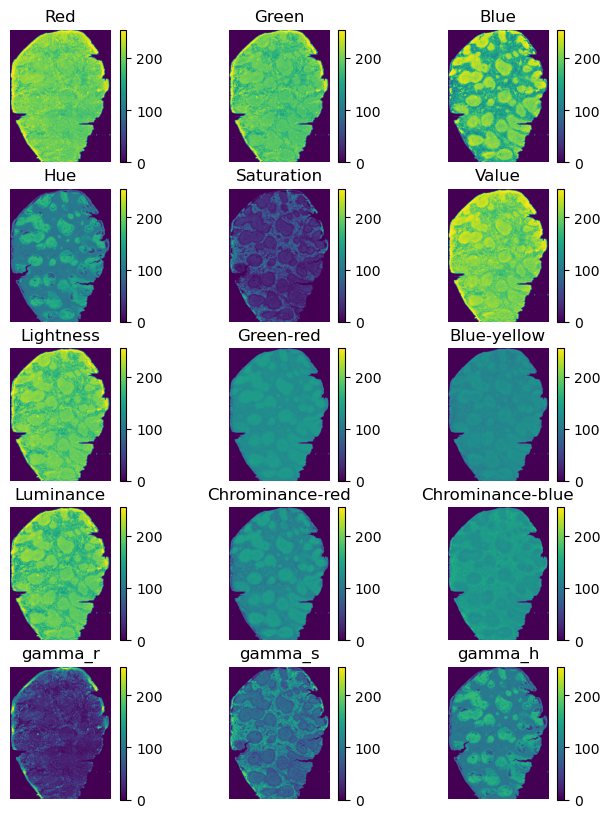

In [38]:
plt.figure(figsize=(8, 10))
ax=plt.subplot(5,3,1)
plt.imshow(r_image, vmin=0,vmax=255, cmap=plt.cm.viridis)
plt.title('Red')
plt.colorbar()
plt.axis('off')


ax=plt.subplot(5,3,2)
plt.imshow(g_image, vmin=0,vmax=255, cmap=plt.cm.viridis)
plt.title('Green')
plt.colorbar()
plt.axis('off')


ax=plt.subplot(5,3,3)
plt.imshow(b_image, vmin=0,vmax=255, cmap=plt.cm.viridis)
plt.title('Blue')
plt.colorbar()
plt.axis('off')


ax=plt.subplot(5,3,4)
plt.imshow(h_image, vmin=0,vmax=255, cmap=plt.cm.viridis)
plt.title('Hue')
plt.colorbar()
plt.axis('off')


ax=plt.subplot(5,3,5)
plt.imshow(s_image, vmin=0,vmax=255, cmap=plt.cm.viridis)
plt.title('Saturation')
plt.colorbar()
plt.axis('off')


ax=plt.subplot(5,3,6)
plt.imshow(v_image, vmin=0,vmax=255, cmap=plt.cm.viridis)
plt.title('Value')
plt.colorbar()
plt.axis('off')


ax=plt.subplot(5,3,7)
plt.imshow(l_image, vmin=0,vmax=255, cmap=plt.cm.viridis)
plt.title('Lightness')
plt.colorbar()
plt.axis('off')


ax=plt.subplot(5,3,8)
plt.imshow(a_image, vmin=0,vmax=255, cmap=plt.cm.viridis)
plt.title('Green-red')
plt.colorbar()
plt.axis('off')


ax=plt.subplot(5,3,9)
plt.imshow(b_lab_image, vmin=0,vmax=255, cmap=plt.cm.viridis)
plt.title('Blue-yellow')
plt.colorbar()
plt.axis('off')


ax=plt.subplot(5,3,10)
plt.imshow(luma_image, vmin=0,vmax=255, cmap=plt.cm.viridis)
plt.title('Luminance')
plt.colorbar()
plt.axis('off')


ax=plt.subplot(5,3,11)
plt.imshow(reddif_image, vmin=0,vmax=255, cmap=plt.cm.viridis)
plt.title('Chrominance-red')
plt.colorbar()
plt.axis('off')


ax=plt.subplot(5,3,12)
plt.imshow(bluedif_image, vmin=0,vmax=255, cmap=plt.cm.viridis)
plt.title('Chrominance-blue')
plt.colorbar()
plt.axis('off')

ax=plt.subplot(5,3,13)
plt.imshow(gamma_r_image, vmin=0,vmax=255, cmap=plt.cm.viridis)
plt.title('gamma_r')
plt.colorbar()
plt.axis('off')


ax=plt.subplot(5,3,14)
plt.imshow(gamma_s_image, vmin=0,vmax=255, cmap=plt.cm.viridis)
plt.title('gamma_s')
plt.colorbar()
plt.axis('off')


ax=plt.subplot(5,3,15)
plt.imshow(gamma_h_image, vmin=0,vmax=255, cmap=plt.cm.viridis)
plt.title('gamma_h')
plt.colorbar()
plt.axis('off')
plt.show()

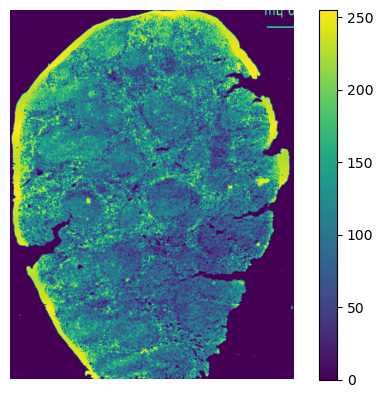

AF image size: (1880, 1444)


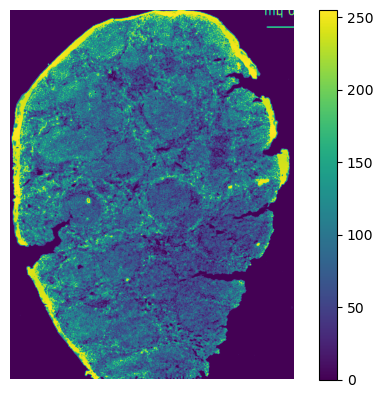

AF image size: (1880, 1444)


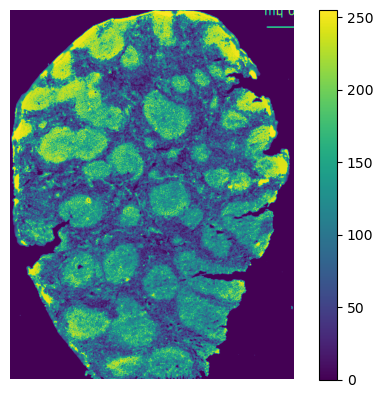

AF image size: (1880, 1444)


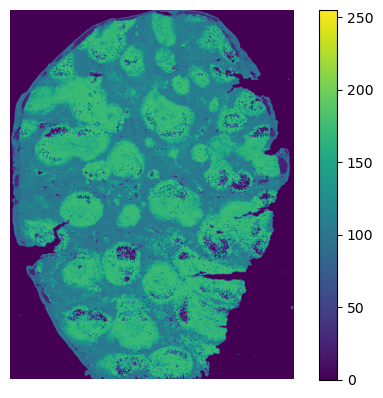

AF image size: (1880, 1444)


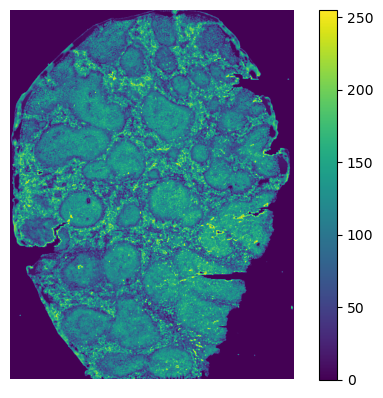

AF image size: (1880, 1444)


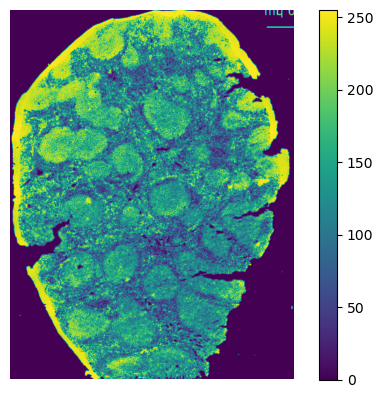

AF image size: (1880, 1444)


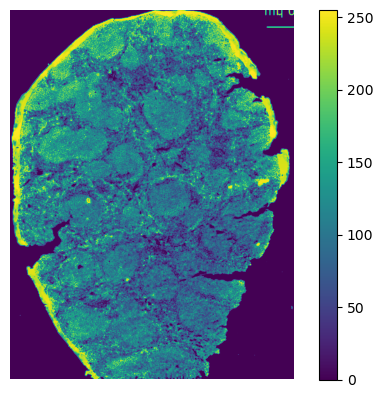

AF image size: (1880, 1444)


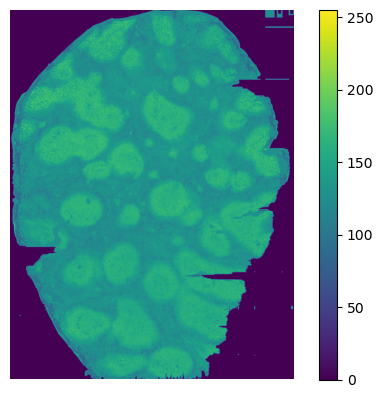

AF image size: (1880, 1444)


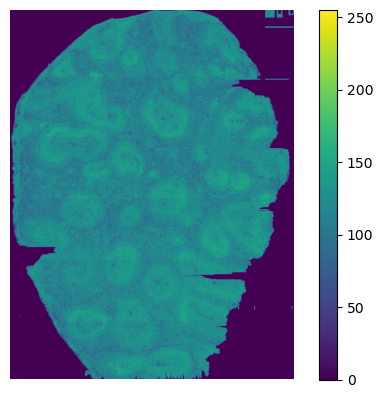

AF image size: (1880, 1444)


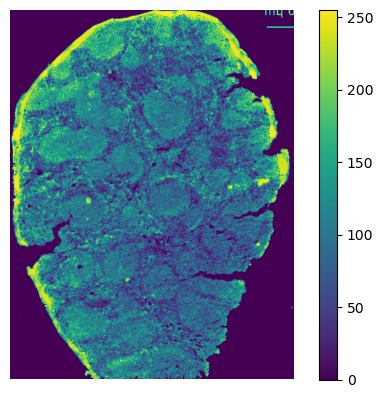

AF image size: (1880, 1444)


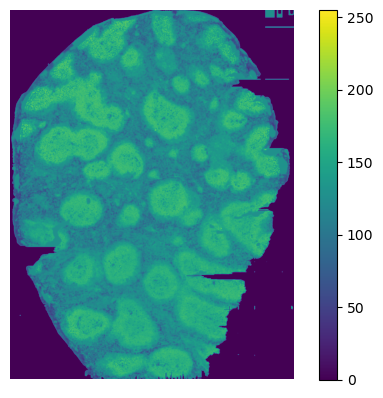

AF image size: (1880, 1444)


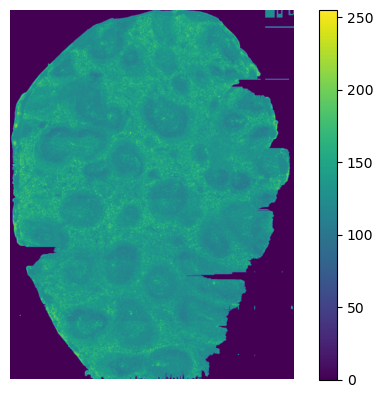

AF image size: (1880, 1444)


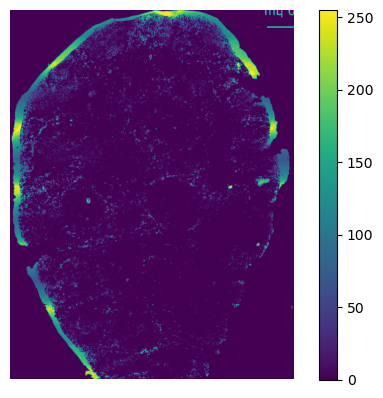

AF image size: (1880, 1444)


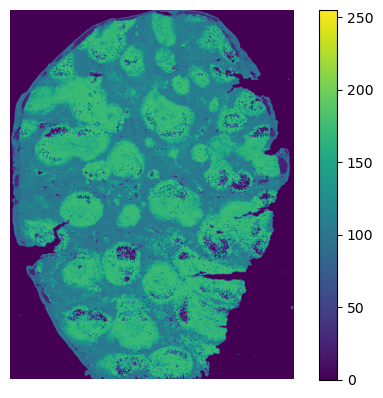

AF image size: (1880, 1444)


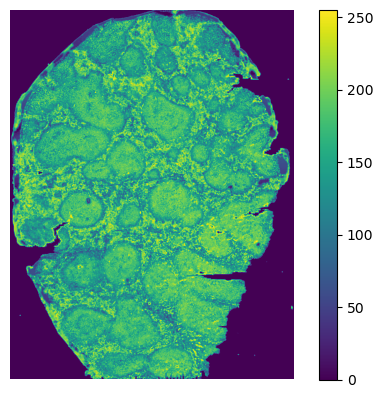

AF image size: (1880, 1444)


In [48]:
red_gray_image = convert_to_greyscale(r_image)
green_gray_image = convert_to_greyscale(g_image)
blue_gray_image = convert_to_greyscale(b_image)
hue_gray_image = convert_to_greyscale(h_image)
satu_gray_image = convert_to_greyscale(s_image)
bri_gray_image = convert_to_greyscale(v_image)
lumi_gray_image = convert_to_greyscale(l_image)
greenred_gray_image = convert_to_greyscale(a_image)
bluered_gray_image = convert_to_greyscale(b_lab_image)
luma_gray_image = convert_to_greyscale(luma_image)
reddif_gray_image = convert_to_greyscale(reddif_image)
bluedif_gray_image = convert_to_greyscale(bluedif_image)
gamma_r_gray_image = convert_to_greyscale(gamma_r_image)
gamma_h_gray_image = convert_to_greyscale(gamma_h_image)
gamma_s_gray_image = convert_to_greyscale(gamma_s_image)

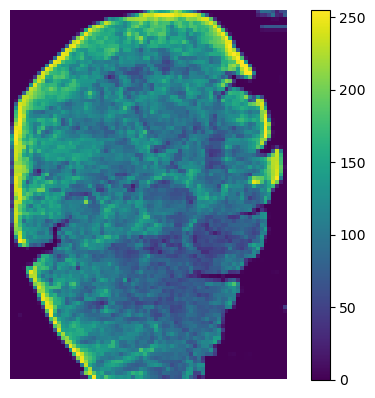

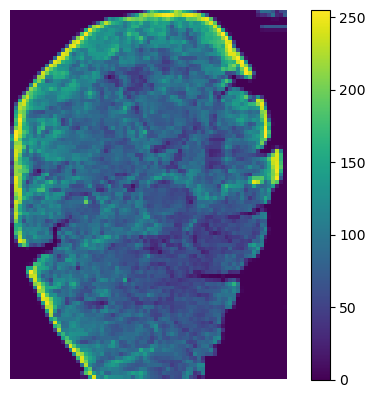

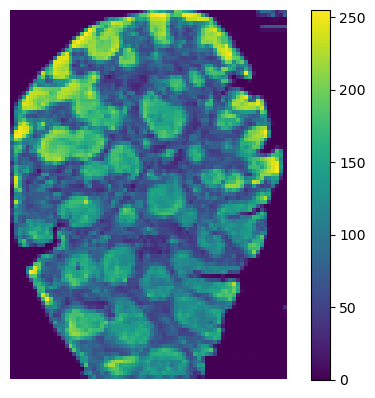

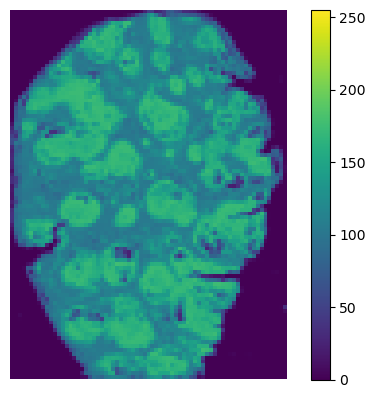

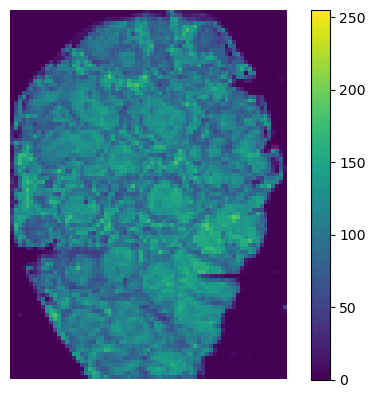

...

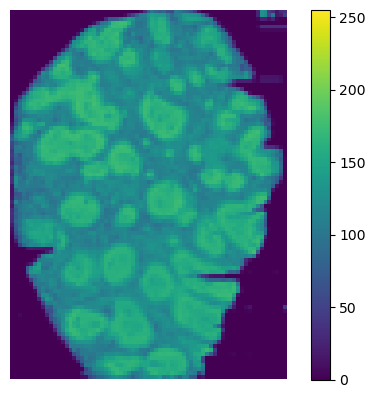

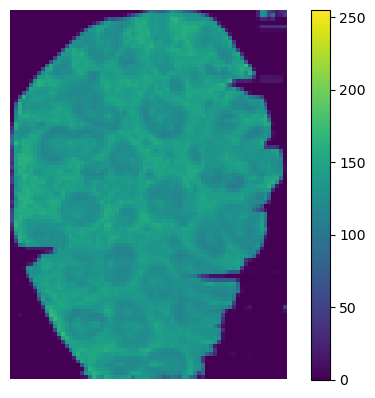

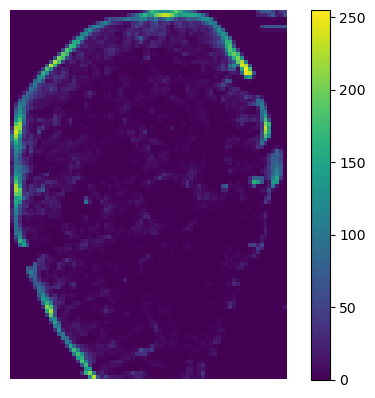

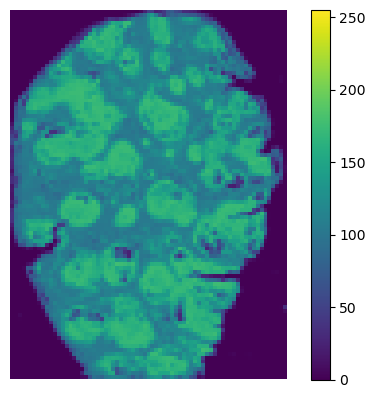

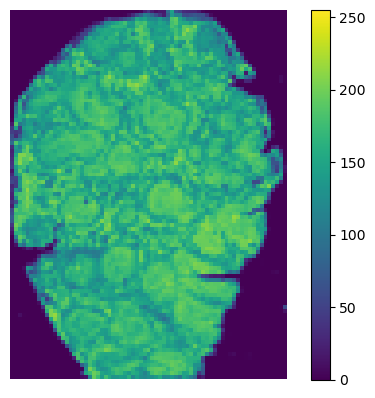

In [49]:
x = 71
y = 95
Red = rezise_AF_image(x, y, red_gray_image)
Green= rezise_AF_image(x, y, green_gray_image)
Blue = rezise_AF_image(x, y, blue_gray_image)
Hue = rezise_AF_image(x, y, hue_gray_image)
Saturation = rezise_AF_image(x, y, satu_gray_image)
Bri = rezise_AF_image(x, y, bri_gray_image)
Lumi = rezise_AF_image(x, y, lumi_gray_image)
Gre_Red = rezise_AF_image(x, y, greenred_gray_image)
Blu_Red = rezise_AF_image(x, y, bluered_gray_image)
Luma = rezise_AF_image(x, y, luma_gray_image)
Reddif = rezise_AF_image(x, y, reddif_gray_image)
Bluedif = rezise_AF_image(x, y, bluedif_gray_image)
Gamma_r = rezise_AF_image(x, y, gamma_r_gray_image)
Gamma_h = rezise_AF_image(x, y, gamma_h_gray_image)
Gamma_s = rezise_AF_image(x, y, gamma_s_gray_image)

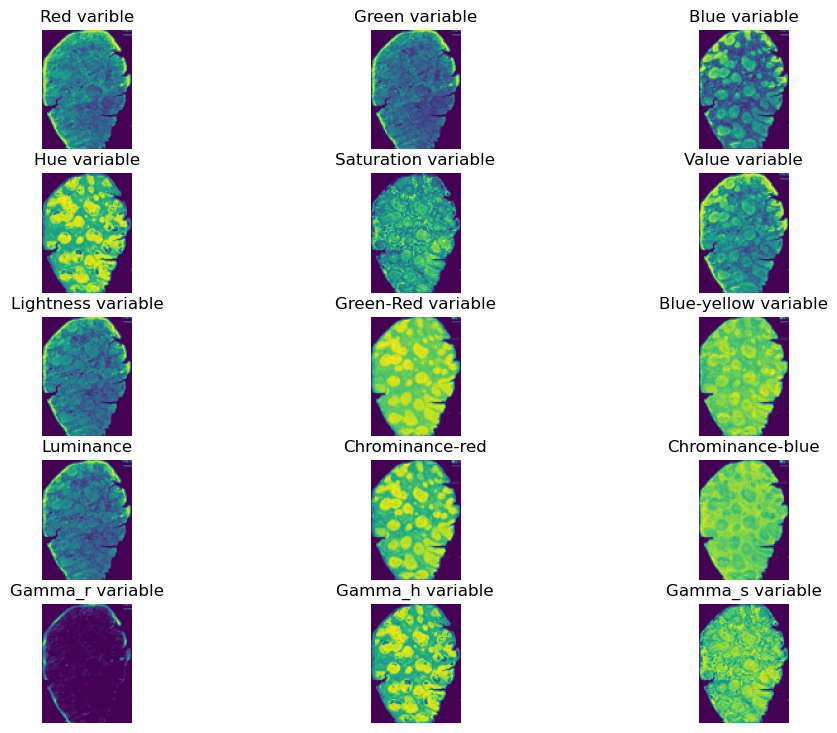

In [50]:
plt.figure(figsize=(12, 9))

plt.subplot(5, 3, 1)
plt.imshow(Red, cmap='viridis')
plt.title('Red varible')
plt.axis('off')

plt.subplot(5, 3, 2)
plt.imshow(Green, cmap='viridis')
plt.title('Green variable')
plt.axis('off')

plt.subplot(5, 3, 3)
plt.imshow(Blue, cmap='viridis')
plt.title('Blue variable')
plt.axis('off')

plt.subplot(5, 3, 4)
plt.imshow(Hue, cmap='viridis')
plt.title('Hue variable')
plt.axis('off')

plt.subplot(5, 3, 5)
plt.imshow(Saturation, cmap='viridis')
plt.title('Saturation variable')
plt.axis('off')

plt.subplot(5, 3, 6)
plt.imshow(Bri, cmap='viridis')
plt.title('Value variable')
plt.axis('off')

plt.subplot(5, 3, 7)
plt.imshow(Lumi, cmap='viridis')
plt.title('Lightness variable')
plt.axis('off')

plt.subplot(5, 3, 8)
plt.imshow(Gre_Red, cmap='viridis')
plt.title('Green-Red variable')
plt.axis('off')

plt.subplot(5, 3, 9)
plt.imshow(Blu_Red, cmap='viridis')
plt.title('Blue-yellow variable')
plt.axis('off')

plt.subplot(5, 3, 10)
plt.imshow(Luma, cmap='viridis')
plt.title('Luminance')
plt.axis('off')

plt.subplot(5, 3, 11)
plt.imshow(Reddif, cmap='viridis')
plt.title('Chrominance-red')
plt.axis('off')

plt.subplot(5, 3, 12)
plt.imshow(Bluedif, cmap='viridis')
plt.title('Chrominance-blue')
plt.axis('off')

plt.subplot(5, 3, 13)
plt.imshow(Gamma_r, cmap='viridis')
plt.title('Gamma_r variable')
plt.axis('off')

plt.subplot(5, 3, 14)
plt.imshow(Gamma_h, cmap='viridis')
plt.title('Gamma_h variable')
plt.axis('off')

plt.subplot(5, 3, 15)
plt.imshow(Gamma_s, cmap='viridis')
plt.title('Gamma_s variable')
plt.axis('off')

plt.show()

# Finding Correlations between Microscopy Data and LA-ICP-MS Data Using OLS Regression

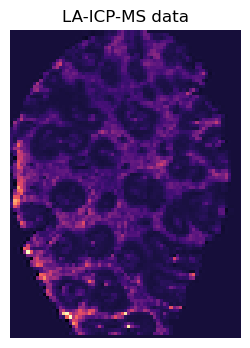

In [51]:
#Replot the LA-ICP-MS image that will be used in the image fusion
plt.figure(figsize=(5, 4))
plt.imshow(ResultArray, cmap='magma')
plt.title('LA-ICP-MS data')
plt.axis('off')
plt.show()

In [52]:
Red_image_flat = Red.flatten()
Green_image_flat = Green.flatten()
Blue_image_flat = Blue.flatten()
Hue_image_flat = Hue.flatten()
Saturation_image_flat = Saturation.flatten()
Bright_image_flat = Bri.flatten()
Luminance_image_flat = Lumi.flatten()
Green_Red_image_flat = Gre_Red.flatten()
Blue_Red_image_flat = Blu_Red.flatten()
Luma_image_flat = Luma.flatten()
Reddif_image_flat = Reddif.flatten()
Bluedif_image_flat = Bluedif.flatten()
Gamma_r_image_flat = Gamma_r.flatten()
Gamma_h_image_flat = Gamma_h.flatten()
Gamma_s_image_flat = Gamma_s.flatten()
LA_image_flat = ResultArray.flatten()

# Assigning Microscopy and LA-ICP-MS Variables for Multivariate Regression
In a typical multivariate regression setup, you need to assign:
- Microscopy variables as independent variables (X).
- LA-ICP-MS variables as the dependent variable (y).
This allows us to model the relationship between the microscopy data and the LA-ICP-MS data.

In [53]:
data = {}
data['Green'] = Green_image_flat
data['Red'] = Red_image_flat
data['Blue'] = Blue_image_flat
data['Hue'] = Hue_image_flat
data['Saturation'] = Saturation_image_flat
data['Bright'] = Bright_image_flat
data['Luminance'] = Luminance_image_flat
data['Green_Red'] = Green_Red_image_flat
data['Blue_Red'] = Blue_Red_image_flat
data['Luma'] = Luma_image_flat
data['Reddif'] = Reddif_image_flat
data['Bluedif'] = Bluedif_image_flat
data['Gamma_r'] = Gamma_r_image_flat
data['Gamma_h'] = Gamma_h_image_flat
data['Gamma_s'] = Gamma_s_image_flat

data['LA'] = LA_image_flat
#print(data)

df = pd.DataFrame(data)

x = df[['Red','Green','Blue','Hue','Saturation','Bright','Luminance','Green_Red','Blue_Red','Luma','Reddif','Bluedif']]
y = df['LA']


# Building a Cross-Modality Model Using OLS Regression
- The goal is to obtain the model coefficients using OLS regression, which can then be used to reconstruct the high-resolution LA-ICP-MS image from the microscopy data.

- After fitting the OLS model and obtaining the coefficients, you can use these coefficients to reconstruct a high-resolution LA-ICP-MS image based on the microscopy data.

In [54]:
regr = linear_model.LinearRegression()
regr.fit(x, y)

print('Intercept: \n', regr.intercept_)
print('Coefficients: \n', regr.coef_)

x = sm.add_constant(x) # adding a constant

model = sm.OLS(y, x).fit()
predictions = model.predict(x) 

print_model = model.summary()
print(print_model)

summary = model.summary()

Intercept: 
 -237.13078515950656
Coefficients: 
 [   27.27062588   -27.26471144  -502.5922834    -24.93194189
    74.08963399   132.79879005   460.86479122 -1277.08016835
  -406.13153676   -65.95193308  1433.79673397   280.62704233]
                            OLS Regression Results                            
Dep. Variable:                     LA   R-squared:                       0.560
Model:                            OLS   Adj. R-squared:                  0.559
Method:                 Least Squares   F-statistic:                     714.3
Date:                Wed, 19 Feb 2025   Prob (F-statistic):               0.00
Time:                        11:19:16   Log-Likelihood:                -70570.
No. Observations:                6745   AIC:                         1.412e+05
Df Residuals:                    6732   BIC:                         1.413e+05
Df Model:                          12                                         
Covariance Type:            nonrobust                   

# Reconstructing a High-resolution LA-ICP-MS Image from a Cross-modality Model Using OLS Regression

In [55]:
R = red_gray_image
G = green_gray_image 
B = blue_gray_image 
H = hue_gray_image
S = satu_gray_image 
BRI = bri_gray_image 
L = lumi_gray_image 
GR = greenred_gray_image
BR = bluered_gray_image
LU = luma_gray_image
RD = reddif_gray_image
BD =  bluedif_gray_image
GAR = gamma_r_gray_image
GAS = gamma_s_gray_image
GAH = gamma_h_gray_image


- Recheck the dimension of high resolution microscopy images

In [56]:
R = np.asarray(R)
dimension = R.shape
print("Red image dimension: ", dimension)

G = np.asarray(G)
dimension = G.shape
print("Green image dimension: ", dimension)

B = np.asarray(B)
dimension = B.shape
print("Blue image dimension: ", dimension)

H = np.asarray(H)
dimension = H.shape
print("Hue image dimension: ", dimension)

S = np.asarray(S)
dimension = S.shape
print("Saturation image dimension: ", dimension)

BRI = np.asarray(BRI)
dimension = BRI.shape
print("Value image dimension: ", dimension)

L = np.asarray(L)
dimension = L.shape
print("Lightness image dimension: ", dimension)

GR = np.asarray(GR)
dimension = GR.shape
print("Green-Red image dimension: ", dimension)

BR = np.asarray(BR)
dimension = BR.shape
print("Blue-yellow image dimension: ", dimension)

LU = np.asarray(LU)
dimension = BR.shape
print("Luminance image dimension: ", dimension)

RD = np.asarray(RD)
dimension = BR.shape
print("Chrominance-blue image dimension: ", dimension)

BD = np.asarray(BD)
dimension = BR.shape
print("Chrominance-red image dimension: ", dimension)

GAR = np.asarray(GAR)
dimension = GAR.shape
print("Gamma_R dimension: ", dimension)

GAS = np.asarray(GAS)
dimension = GAS.shape
print("Gamma_S dimension: ", dimension)

GAH = np.asarray(GAH)
dimension = GAH.shape
print("Gamma_H dimension: ", dimension)


Red image dimension:  (1880, 1444)
Green image dimension:  (1880, 1444)
Blue image dimension:  (1880, 1444)
Hue image dimension:  (1880, 1444)
Saturation image dimension:  (1880, 1444)
Value image dimension:  (1880, 1444)
Lightness image dimension:  (1880, 1444)
Green-Red image dimension:  (1880, 1444)
Blue-yellow image dimension:  (1880, 1444)
Luminance image dimension:  (1880, 1444)
Chrominance-blue image dimension:  (1880, 1444)
Chrominance-red image dimension:  (1880, 1444)
Gamma_R dimension:  (1880, 1444)
Gamma_S dimension:  (1880, 1444)
Gamma_H dimension:  (1880, 1444)


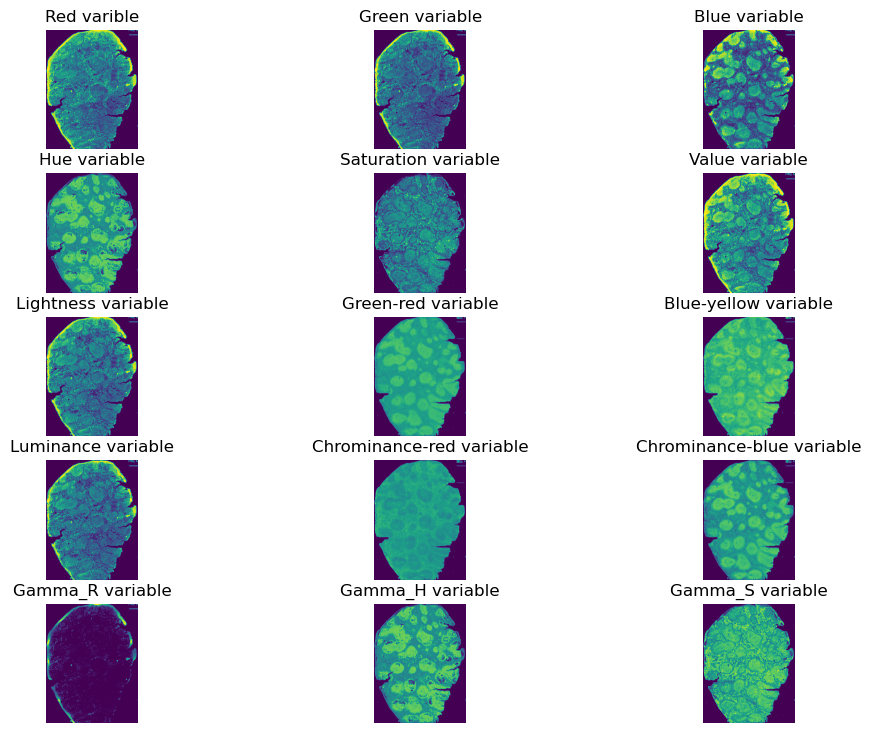

In [57]:
plt.figure(figsize=(12, 9))

plt.subplot(5, 3, 1)
plt.imshow(R, cmap='viridis')
plt.title('Red varible')
plt.axis('off')

plt.subplot(5, 3, 2)
plt.imshow(G, cmap='viridis')
plt.title('Green variable')
plt.axis('off')

plt.subplot(5, 3, 3)
plt.imshow(B, cmap='viridis')
plt.title('Blue variable')
plt.axis('off')

plt.subplot(5, 3, 4)
plt.imshow(H, cmap='viridis')
plt.title('Hue variable')
plt.axis('off')

plt.subplot(5, 3, 5)
plt.imshow(S, cmap='viridis')
plt.title('Saturation variable')
plt.axis('off')

plt.subplot(5, 3, 6)
plt.imshow(BRI, cmap='viridis')
plt.title('Value variable')
plt.axis('off')

plt.subplot(5, 3, 7)
plt.imshow(L, cmap='viridis')
plt.title('Lightness variable')
plt.axis('off')

plt.subplot(5, 3, 8)
plt.imshow(GR, cmap='viridis')
plt.title('Green-red variable')
plt.axis('off')

plt.subplot(5, 3, 9)
plt.imshow(BR, cmap='viridis')
plt.title('Blue-yellow variable')
plt.axis('off')

plt.subplot(5, 3, 10)
plt.imshow(LU, cmap='viridis')
plt.title('Luminance variable')
plt.axis('off')

plt.subplot(5, 3, 11)
plt.imshow(BD, cmap='viridis')
plt.title('Chrominance-red variable')
plt.axis('off')

plt.subplot(5, 3, 12)
plt.imshow(RD, cmap='viridis')
plt.title('Chrominance-blue variable')
plt.axis('off')

plt.subplot(5, 3, 13)
plt.imshow(GAR, cmap='viridis')
plt.title('Gamma_R variable')
plt.axis('off')

plt.subplot(5, 3, 14)
plt.imshow(GAH, cmap='viridis')
plt.title('Gamma_H variable')
plt.axis('off')

plt.subplot(5, 3, 15)
plt.imshow(GAS, cmap='viridis')
plt.title('Gamma_S variable')
plt.axis('off')

plt.show()

- Define interception and a linear coefficient for each independent variable obtained from the cross-modality model.
- If some variables are not used in building cross-modality model, specify theirs coeffiencet as zero.

In [58]:
inter = -237.13
r = 27.27
g = -27.26
b = -502.59
h = -24.93
s = 74.09
bri = 132.80
l = 460.86
gr = -1277.08
br = -406.13
lu = -65.95
rd = 1433.80
bd = 280.63
gar = 0
gas = 0
gah = 0

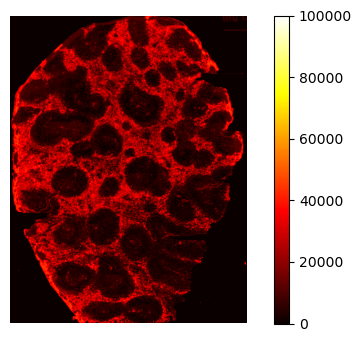

In [59]:
high_res_image_OLS = inter + (r*R) + (g*G) + (b*B) + (h*H) + (s*S) + (bri*BRI) + (l*L) + (gr*GR)+ (br*BR) + (lu*LU) + (rd*RD) + (bd*BD) + (gar*GAR) + (gah*GAH) + (gas*GAS)
plt.figure(figsize=(7, 4))
plt.imshow(high_res_image_OLS,vmin=0,vmax=100000, cmap=plt.cm.hot)
plt.axis('off')  # Hide the axes
plt.colorbar()
plt.title('')
plt.show()

- High resolution image with a background removal

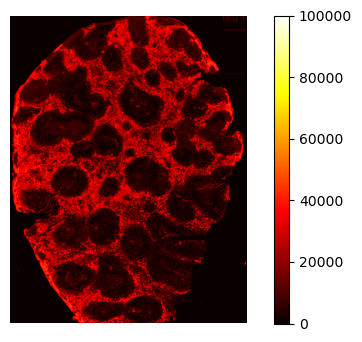

In [60]:
high_res_image_OLS = high_res_image_OLS*background_mask_HR
plt.figure(figsize=(7, 4))
plt.imshow(high_res_image_OLS,vmin=0,vmax=100000, cmap=plt.cm.hot)
plt.axis('off')  # Hide the axes
plt.colorbar()
plt.title('')
plt.show()

# Fused image evaluation for OLS prediction

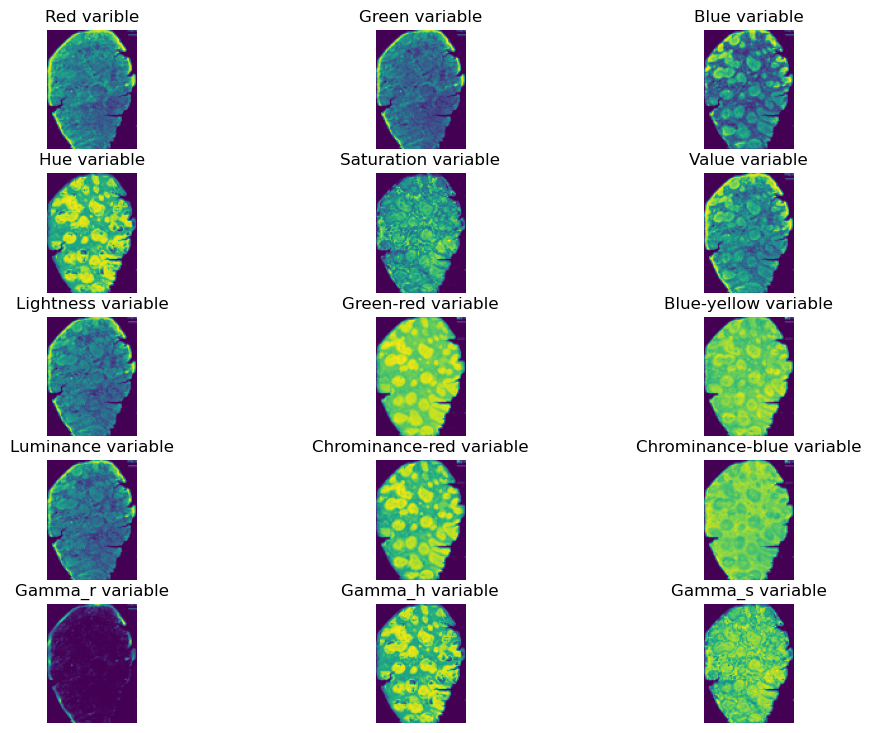

In [61]:
plt.figure(figsize=(12, 9))

plt.subplot(5, 3, 1)
plt.imshow(Red, cmap='viridis')
plt.title('Red varible')
plt.axis('off')

plt.subplot(5, 3, 2)
plt.imshow(Green, cmap='viridis')
plt.title('Green variable')
plt.axis('off')

plt.subplot(5, 3, 3)
plt.imshow(Blue, cmap='viridis')
plt.title('Blue variable')
plt.axis('off')

plt.subplot(5, 3, 4)
plt.imshow(Hue, cmap='viridis')
plt.title('Hue variable')
plt.axis('off')

plt.subplot(5, 3, 5)
plt.imshow(Saturation, cmap='viridis')
plt.title('Saturation variable')
plt.axis('off')

plt.subplot(5, 3, 6)
plt.imshow(Bri, cmap='viridis')
plt.title('Value variable')
plt.axis('off')

plt.subplot(5, 3, 7)
plt.imshow(Lumi, cmap='viridis')
plt.title('Lightness variable')
plt.axis('off')

plt.subplot(5, 3, 8)
plt.imshow(Gre_Red, cmap='viridis')
plt.title('Green-red variable')
plt.axis('off')

plt.subplot(5, 3, 9)
plt.imshow(Blu_Red, cmap='viridis')
plt.title('Blue-yellow variable')
plt.axis('off')

plt.subplot(5, 3, 10)
plt.imshow(Luma, cmap='viridis')
plt.title('Luminance variable')
plt.axis('off')

plt.subplot(5, 3, 11)
plt.imshow(Reddif, cmap='viridis')
plt.title('Chrominance-red variable')
plt.axis('off')

plt.subplot(5, 3, 12)
plt.imshow(Bluedif, cmap='viridis')
plt.title('Chrominance-blue variable')
plt.axis('off')

plt.subplot(5, 3, 13)
plt.imshow(Gamma_r, cmap='viridis')
plt.title('Gamma_r variable')
plt.axis('off')

plt.subplot(5, 3, 14)
plt.imshow(Gamma_h, cmap='viridis')
plt.title('Gamma_h variable')
plt.axis('off')

plt.subplot(5, 3, 15)
plt.imshow(Gamma_s, cmap='viridis')
plt.title('Gamma_s variable')
plt.axis('off')

plt.show()

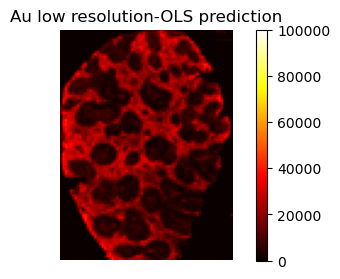

In [62]:
Low_res_image_OLS = inter + (r*Red) + (g*Green) + (b*Blue) + (h*Hue) + (s*Saturation) + (bri*Bri) + (l*Lumi) + (gr*Gre_Red)+ (br*Blu_Red) + (lu*Luma) + (rd*Reddif) + (bd*Bluedif) + (gar*Gamma_r) + (gah*Gamma_h) + (gas*Gamma_s)
plt.figure(figsize=(6, 3))
plt.imshow(Low_res_image_OLS,vmin=0,vmax=100000, cmap=plt.cm.hot)
plt.axis('off')  # Hide the axes
plt.colorbar()
plt.title('Au low resolution-OLS prediction')
plt.show()

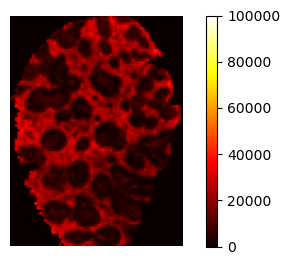

In [63]:
Low_res_image_OLS = Low_res_image_OLS*background_mask_LR
plt.figure(figsize=(6, 3))
plt.imshow(Low_res_image_OLS,vmin=0,vmax=100000, cmap=plt.cm.hot)
plt.axis('off')  # Hide the axes
plt.colorbar()
plt.title('')
plt.show()

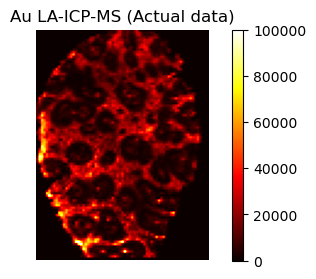

In [64]:
plt.figure(figsize=(6, 3))
plt.imshow(ResultArray,vmin=0,vmax=100000, cmap=plt.cm.hot)
plt.axis('off')  # Hide the axes
plt.colorbar()
plt.title('Au LA-ICP-MS (Actual data)')
plt.show()

In [65]:
LA1 = img_as_float(ResultArray).astype(float)
LA2 = img_as_float(Low_res_image_OLS).astype(float)

ssi = structural_similarity_index(LA1, LA2)

print("Structural Similarity Index:", ssi)

Structural Similarity Index: 0.578766538229399


# Finding correlations between microscopy data and LA-ICP-MS data using PLS regression

In [66]:
data = {}
data['Green'] = Green_image_flat
data['Red'] = Red_image_flat
data['Blue'] = Blue_image_flat
data['Hue'] = Hue_image_flat
data['Saturation'] = Saturation_image_flat
data['Bright'] = Bright_image_flat
data['Luminance'] = Luminance_image_flat
data['Green_Red'] = Green_Red_image_flat
data['Blue_Red'] = Blue_Red_image_flat
data['Luma'] = Luma_image_flat
data['Reddif'] = Reddif_image_flat
data['Bluedif'] = Bluedif_image_flat

data['Gamma_r'] = Gamma_r_image_flat
data['Gamma_h'] = Gamma_h_image_flat
data['Gamma_s'] = Gamma_s_image_flat

data['LA'] = LA_image_flat
#print(data)

df = pd.DataFrame(data)

x = df[['Red','Green','Blue','Hue','Saturation','Bright','Luminance','Green_Red','Blue_Red','Luma','Reddif','Bluedif']]
y = df['LA']


# Determine MSE value to reduce the dimension of microscopy data

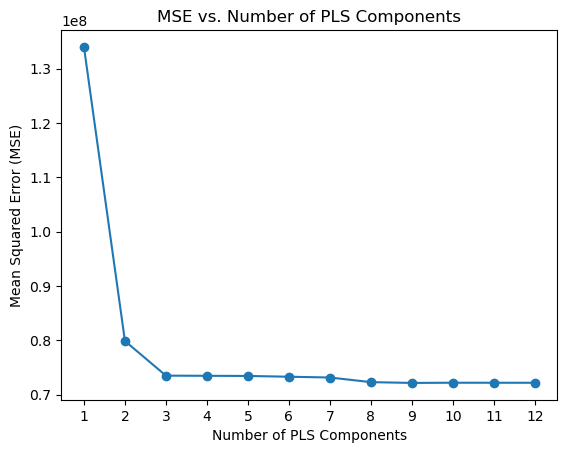

Optimal number of components: 9


In [67]:
mse_values = []
n_components = range(1, min(len(x.columns), len(y)) + 1)

# Loop through different numbers of components
for n in n_components:
    pls = PLSRegression(n_components=n)
    mse_list = []

    # Perform leave-one-out cross-validation
    for i in range(len(x)):
        x_train = np.delete(x.values, i, axis=0)
        y_train = np.delete(y.values, i, axis=0)
        x_test = x.values[i].reshape(1, -1)
        y_test = y.values[i].reshape(1, -1)

        # Fit the PLS model and predict
        pls.fit(x_train, y_train)
        y_pred = pls.predict(x_test)

        # Calculate MSE
        mse = mean_squared_error(y_test, y_pred)
        mse_list.append(mse)

    # Calculate average MSE for current number of components
    mse_avg = np.mean(mse_list)
    mse_values.append(mse_avg)

# Plotting the MSE vs. number of components
plt.plot(n_components, mse_values, marker='o')
plt.xlabel('Number of PLS Components')
plt.ylabel('Mean Squared Error (MSE)')
plt.title('MSE vs. Number of PLS Components')
plt.xticks(n_components)
plt.grid(False)
plt.show()

# Find the optimal number of components based on the minimum MSE
optimal_components = np.argmin(mse_values) + 1
print(f"Optimal number of components: {optimal_components}")

In [69]:
optimal_components = 9

# Initializing PLS model with the optimal number of components
pls = PLSRegression(n_components=optimal_components)

# Fitting the PLS model
pls.fit(x, y)

# Getting the latent variables
x_latent = pls.x_scores_
y_latent = pls.y_scores_

y_pred = pls.predict(x)
# Performing multivariate linear regression with latent variables
linear_reg = LinearRegression()
linear_reg.fit(x_latent, y)

# Getting coefficients (weights) and intercept
coefficients = linear_reg.coef_
intercept = linear_reg.intercept_


# Reconstructing a High-Resolution LA-ICP-MS Using PLS Regression
- High-resolution microscopy variables are used as a new set of independent variables to predict high-resolution LA-ICP-MS data.
- The 'High_res_variables' have been prepared as a new set of predictors to predict the high-resolution LA-ICP-MS image.

In [70]:
predictions = pls.predict(High_res_variables)
#print(predictions)

- The num_rows and num_cols represent the dimensions of the high-resolution microscopy image.
- For example, this data has dimensions of 1922x1455 pixels.

In [72]:
num_rows = 1880
num_cols = 1444
# Reshape the 1D array into a 2D array with the specified number of rows and columns
H_predicted = predictions.reshape(num_rows, num_cols)

#print(H_predicted)

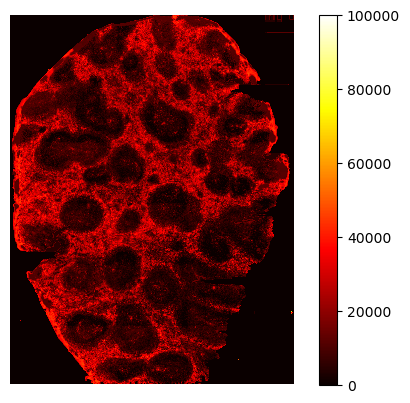

In [73]:
plt.imshow(H_predicted, vmin=0,vmax=100000, cmap=plt.cm.hot, interpolation='nearest')
plt.title('')
plt.axis('off')
plt.colorbar()

Size of the array: 2714720


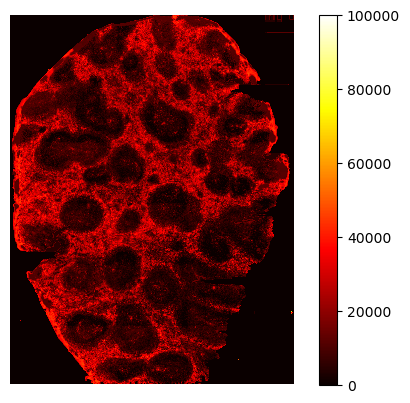

In [74]:
H_predicted = H_predicted*background_mask_HR
plt.imshow(H_predicted, vmin=0,vmax=100000, cmap=plt.cm.hot, interpolation='nearest')
plt.title('')
plt.axis('off')
plt.colorbar()

array_size = H_predicted.size
print("Size of the array:", array_size)

# Cross-Modality Model Evaluation Using PLS Regression
- The low-resolution LA-ICP-MS image is predicted using PLS regression, and this image will be used in a cross-modality evaluation.
- The 'predicted_2D' was generated in the previous step, where low-resolution microscopy variables were used to predict a low-resolution LA-ICP-MS image. The data was generated as a 1D array, so we need to convert that array into a 2D array using the dimensions of the low-resolution LA-ICP-MS image. For example, this low-resolution LA-ICP-MS image has a size of 95x71 pixels.

In [75]:
num_rows = 95
num_cols = 71

# Reshape the 1D array into a 2D array with the specified number of rows and columns
predicted_2D = y_pred.reshape(num_rows, num_cols)

Size of the array: 6745


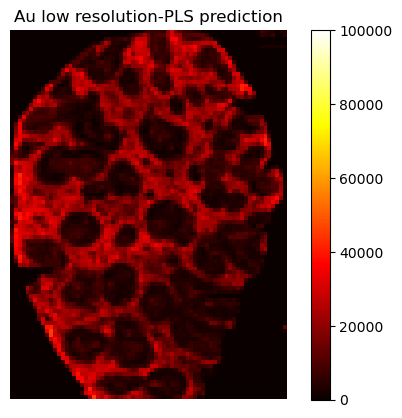

In [76]:
plt.imshow(predicted_2D, vmin=0,vmax=100000, cmap=plt.cm.hot)
plt.title('Au low resolution-PLS prediction')
plt.axis('off')
plt.colorbar()
array_size = predicted_2D.size
print("Size of the array:", array_size)

# Evaluation for PLS prediction

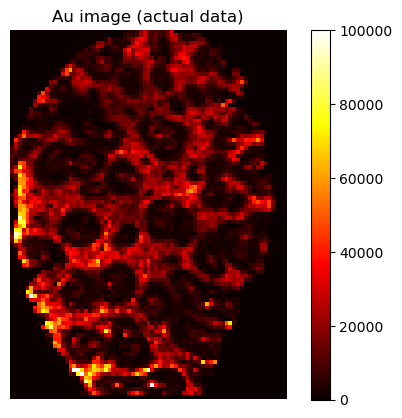

In [77]:
plt.imshow(ResultArray,vmin=0,vmax=100000, cmap=plt.cm.hot)
plt.axis('off')  # Hide the axes
plt.colorbar()
plt.title('Au image (actual data)')
plt.show()

In [78]:
LA1 = img_as_float(ResultArray).astype(float)
LA2 = img_as_float(predicted_2D).astype(float)

ssi = structural_similarity_index(LA1, LA2)

print("Structural Similarity Index:", ssi)

Structural Similarity Index: 0.5936940524062232


# A cross-modality model evaluation using difference image and absolute redidual image

In [79]:
Difference_image = ResultArray - predicted_2D
residual_image  = abs(Difference_image)

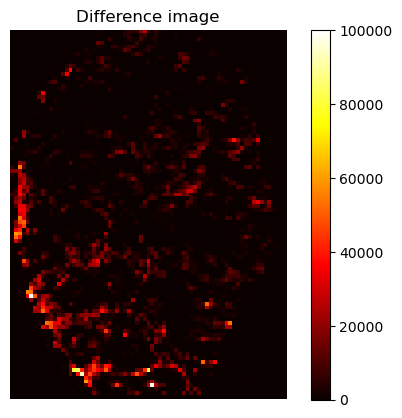

In [80]:
plt.imshow(Difference_image,vmin=0,vmax=100000, cmap=plt.cm.hot)
plt.axis('off')  # Hide the axes
plt.colorbar()
plt.title('Difference image')
plt.show()

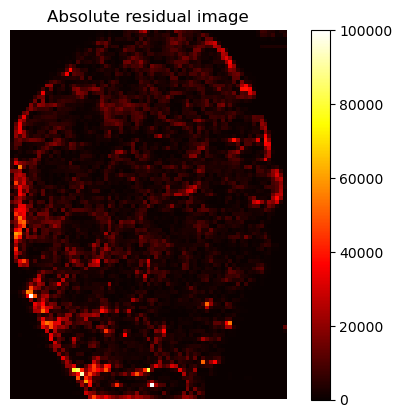

In [81]:
plt.imshow(residual_image,vmin=0,vmax=100000, cmap=plt.cm.hot)
plt.axis('off')  # Hide the axes
plt.colorbar()
plt.title('Absolute residual image')
plt.show()